# Explorative Data Analysis on Taylor Swift songs

In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nrclex
from nrclex import NRCLex
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud

sns.set(style='whitegrid')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/canova/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [70]:
! pip install NRCLex
! pip install textblob
! python3 -m textblob.download_corpora

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)



[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)



[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


[nltk_data] Downloading package brown to /Users/canova/nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package punkt to /Users/canova/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/canova/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/canova/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package conll2000 to
[nltk_data]     /Users/canova/nltk_data...
[nltk_data]   Package conll2000 is already up-to-date!
[nltk_data] Downloading package movie_reviews to
[nltk_data]     /Users/canova/nltk_data...
[nltk_data]   Package movie_reviews is already up-to-date!
Finished.


In [71]:
df_full = pd.read_csv('data/cleaned_data/rag_dataset.csv')

In [72]:
df_full.head()

,song_name,album,happy_sad,relationship,feelings_of_self,glass_half_full,stages,tempo,seriousness,future_prospects,feelings_of_male,togetherness,lyrics,spotify_uri,url
0,cold as you,Taylor Swift,-10,-8,-1,-3,-3,-3,-3,-3,-1,-1,You have a way of coming easily to me\r\n And ...,7an1exwMnfYRcdVQm0yDev,https://open.spotify.com/track/7an1exwMnfYRcdV...
1,i'm only me when i'm with you,Taylor Swift,9,10,3,3,1,2,2,2,3,3,Friday night beneath the stars\r\n In a field ...,0JIdBrXGSJXS72zjF9ss9u,https://open.spotify.com/track/0JIdBrXGSJXS72z...
2,invisible,Taylor Swift,-1,-4,0,-2,1,0,0,0,-1,-3,She can't see the way your eyes\r\n Light up w...,5OOd01o2YS1QFwdpVLds3r,https://open.spotify.com/track/5OOd01o2YS1QFwd...
3,mary's song,Taylor Swift,5,12,0,2,1,2,3,3,3,3,She said I was seven and you were nine\r\n I l...,2QrQCMel6v2JiLxqrg4p2O,https://open.spotify.com/track/2QrQCMel6v2JiLx...
4,our song,Taylor Swift,5,6,2,2,1,0,1,1,3,1,I was ridin' shotgun with my hair undone\r\n I...,15DeqWWQB4dcEWzJg15VrN,https://open.spotify.com/track/15DeqWWQB4dcEWz...


In [73]:
# Remove song from Undefined album
df_full.drop(df_full[df_full['album'] == 'Undefined'].index, inplace=True)
# Get unique albums
albums = list(df_full['album'].unique())
list_albums = ",\n".join(albums)
print(f'Albums:\n{(list_albums)}\n\n{len(albums)} albums in total!')

Albums:
Taylor Swift,
Fearless,
Speak Now,
Red,
1989,
Reputation,
Lover,
folklore,
evermore,
Fearless (Taylor's Version),
Red (Taylor's Version),
Midnights

12 albums in total!


# Scoring based analysis
This analysis is based on the scoring assigned to each songs from the paper [I Knew You Were Trouble: Emotional Trends in the Repertoire of Taylor Swift](https://arxiv.org/pdf/2103.16737.pdf)

In [74]:
df_scores = df_full.copy()
df_scores.drop(columns=['lyrics'], inplace=True)
df_scores

,song_name,album,happy_sad,relationship,feelings_of_self,glass_half_full,stages,tempo,seriousness,future_prospects,feelings_of_male,togetherness,spotify_uri,url
0,cold as you,Taylor Swift,-10,-8,-1,-3,-3,-3,-3,-3,-1,-1,7an1exwMnfYRcdVQm0yDev,https://open.spotify.com/track/7an1exwMnfYRcdV...
1,i'm only me when i'm with you,Taylor Swift,9,10,3,3,1,2,2,2,3,3,0JIdBrXGSJXS72zjF9ss9u,https://open.spotify.com/track/0JIdBrXGSJXS72z...
2,invisible,Taylor Swift,-1,-4,0,-2,1,0,0,0,-1,-3,5OOd01o2YS1QFwdpVLds3r,https://open.spotify.com/track/5OOd01o2YS1QFwd...
3,mary's song,Taylor Swift,5,12,0,2,1,2,3,3,3,3,2QrQCMel6v2JiLxqrg4p2O,https://open.spotify.com/track/2QrQCMel6v2JiLx...
4,our song,Taylor Swift,5,6,2,2,1,0,1,1,3,1,15DeqWWQB4dcEWzJg15VrN,https://open.spotify.com/track/15DeqWWQB4dcEWz...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,paris,Midnights,6,6,1,2,1,2,1,2,1,2,5tWxKWq1DSP1s9WQ5PWuqu,https://open.spotify.com/track/5tWxKWq1DSP1s9W...
176,high infidelity,Midnights,-1,-9,-2,-1,2,0,-2,-2,-2,-3,5kiZGSxgqPdv6rbqL9THdd,https://open.spotify.com/track/5kiZGSxgqPdv6rb...
177,glitch,Midnights,1,7,1,1,-1,0,2,2,2,1,7C0w28EsX0Um2FrZs9gso2,https://open.spotify.com/track/7C0w28EsX0Um2Fr...
178,"would've, could've, should've",Midnights,-3,-4,-2,-1,-2,2,-2,-1,0,-1,4txojlesMFQZGWxwz2EeqB,https://open.spotify.com/track/4txojlesMFQZGWx...


In [75]:
df_scores.describe()

,happy_sad,relationship,feelings_of_self,glass_half_full,stages,tempo,seriousness,future_prospects,feelings_of_male,togetherness
count,179.000000,179.000000,179.000000,179.000000,179.000000,179.000000,179.000000,179.000000,179.000000,179.000000
mean,0.346369,-1.430168,0.027933,-0.670391,0.134078,0.854749,-0.379888,-0.357542,0.212291,-0.905028
std,4.838124,5.560635,1.858567,1.791919,1.955663,1.315900,1.735563,1.775484,1.614424,1.588911
min,-12.000000,-11.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000,-3.000000
25%,-3.000000,-6.000000,-1.000000,-2.000000,-2.000000,0.000000,-2.000000,-2.000000,0.000000,-2.000000
50%,0.000000,-2.000000,0.000000,-1.000000,1.000000,0.000000,-1.000000,0.000000,0.000000,-1.000000
75%,4.500000,2.000000,1.500000,1.000000,2.000000,2.000000,1.000000,1.000000,1.000000,0.000000
max,11.000000,12.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000


In [76]:
df_criteria = pd.read_csv('data/lyrics_criteria.csv')
df_criteria.head()

,criterion,score,description,example
0,feelings_of_self,-3,Feels fully responsible for problems,"""Stupid girl / I should have known / I should ..."
1,feelings_of_self,-2,Feels partial responsibility for problems,“No one teaches you what to do / When a good m...
2,feelings_of_self,-1,Hints at self-deprecation,"“Maybe we got lost in translation, maybe I ask..."
3,feelings_of_self,0,No feelings mentioned/ambiguous feelings,(Blank Space)
4,feelings_of_self,1,Overall positive with serious insecurities,“You have pointed out my flaws again / As if I...


feelings_of_self


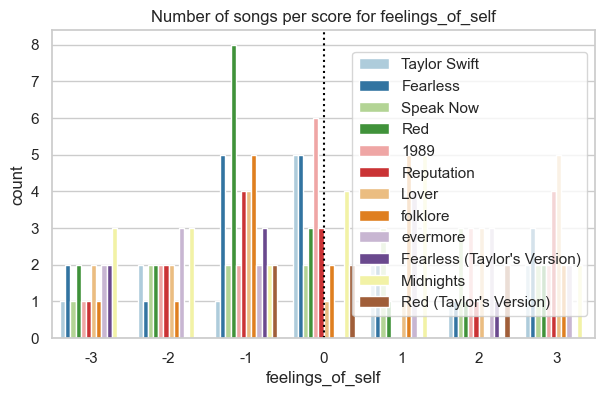

glass_half_full


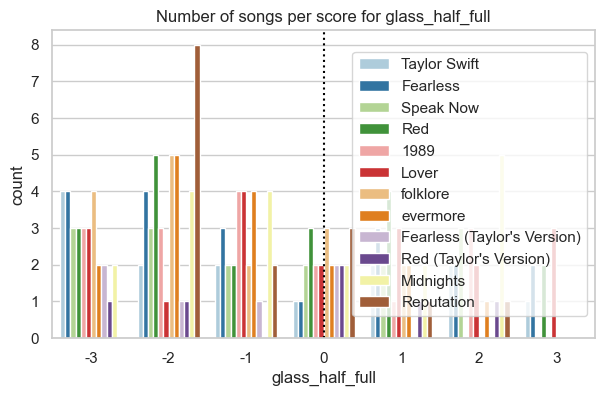

stages


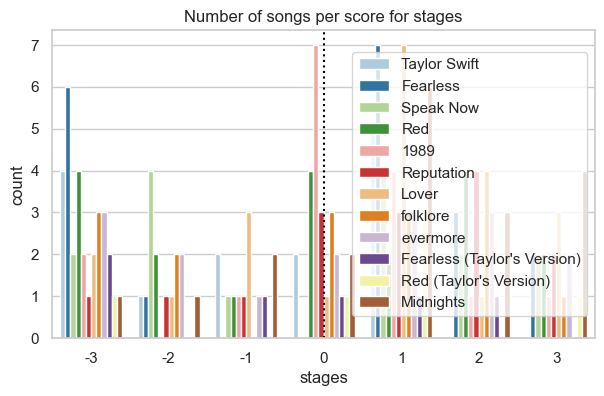

tempo


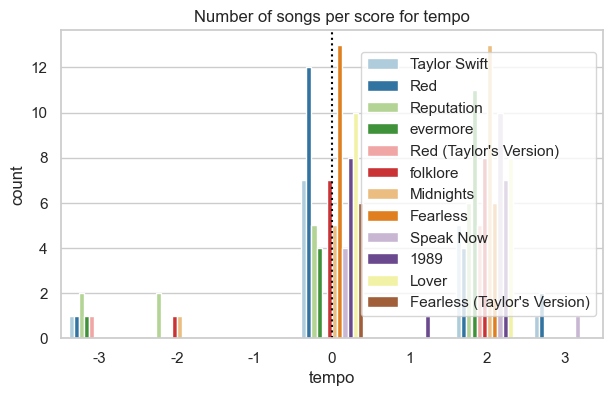

seriousness


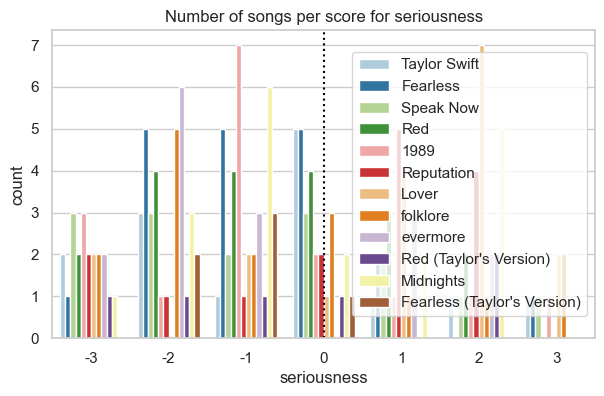

future_prospects


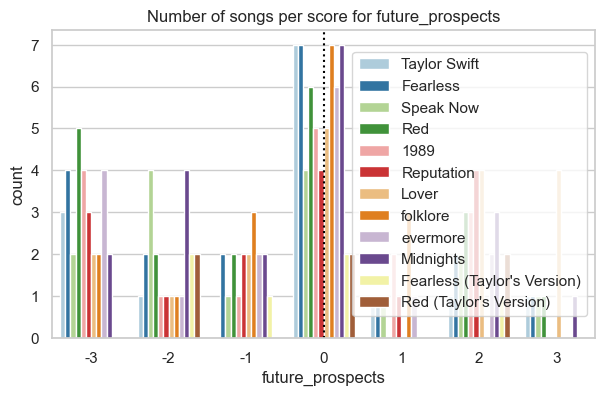

feelings_of_male


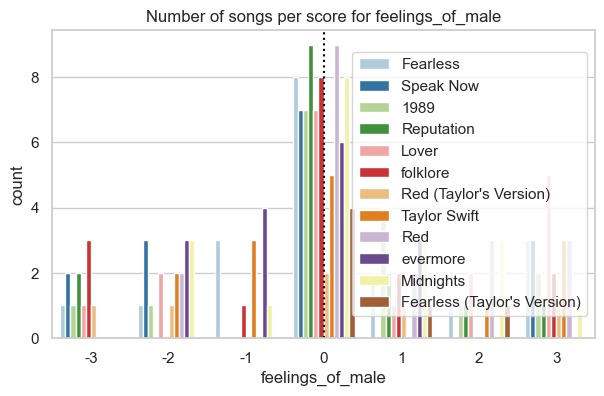

togetherness


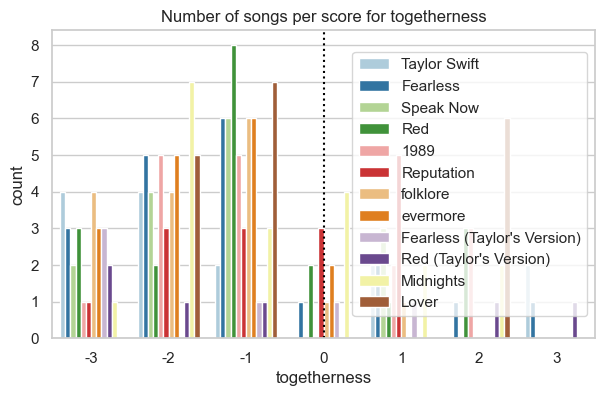

In [9]:
# Plot a groupby based on how many songs have a specific score for each criteria in the dataset
criteria = ['feelings_of_self',	'glass_half_full','stages','tempo','seriousness','future_prospects','feelings_of_male','togetherness']
for c in criteria:
    print(c)
    ticks_range = range(df_scores[c].min(), df_scores[c].max()+1, 1)
    x_zero = list(ticks_range).index(0)
    plt.figure(figsize=(len(ticks_range), 4))
    plt.axvline(x=x_zero, color='black', linestyle='dotted')
    sns.countplot(x=c, data=df_scores, hue=df_scores['album'], palette='Paired', order=ticks_range)
    plt.title(f'Number of songs per score for {c}')
    plt.legend(loc='center right')
    plt.show()


In [101]:
def apply_desc_y_axis_to_axis(ax, df_criteria, criterion):
    if criterion != 'happy_sad' and criterion != 'relationship':
        sub_df = df_criteria[df_criteria['criterion'] == criterion]
        descriptions = {}
        for _, row in sub_df.iterrows():
            score = row['score']
            desc = row['description']
            descriptions[score] = desc

        ax2 = ax.twinx()
        ax2.set_ylim(-3, 3)
        ax2.set_yticks(sorted(descriptions.keys()))
        ax2.set_yticklabels([descriptions[score] for score in (descriptions.keys())])
        ax2.set_zorder(-1)
        

,happy_sad,relationship,feelings_of_self,glass_half_full,stages,seriousness,future_prospects,feelings_of_male,togetherness
album,,,,,,,,,
1989,0.500000,-1.375000,0.187500,-0.750000,0.125000,-0.750000,-0.437500,0.437500,-0.625000
Fearless,0.052632,-1.894737,0.000000,-0.526316,-0.052632,-0.684211,-0.526316,0.263158,-0.947368
Fearless (Taylor's Version),-3.333333,-2.666667,-1.166667,-1.500000,-0.666667,-1.166667,-0.500000,0.500000,-1.500000
Lover,1.777778,1.888889,0.444444,0.055556,0.388889,0.888889,0.555556,0.722222,-0.277778
Midnights,1.526316,-1.000000,-0.315789,-0.315789,0.894737,-0.157895,-0.368421,0.263158,-0.736842
Red,-0.526316,-1.263158,-0.473684,-0.578947,-0.052632,-0.578947,-0.631579,0.684211,-0.736842
Red (Taylor's Version),1.666667,-1.166667,0.333333,-0.333333,0.500000,-0.333333,0.000000,-0.166667,-0.666667
Reputation,0.066667,-0.400000,0.200000,-1.000000,0.733333,0.266667,-0.266667,0.066667,-0.466667
Speak Now,1.266667,-2.466667,0.400000,-0.600000,-0.066667,-0.666667,-0.466667,-0.200000,-1.133333


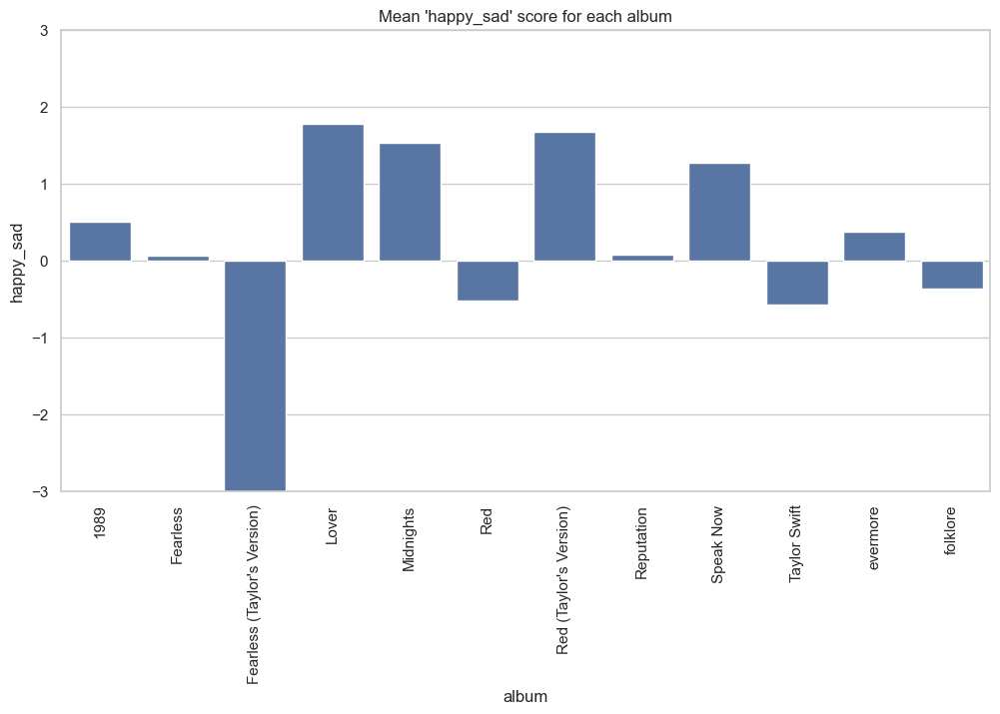

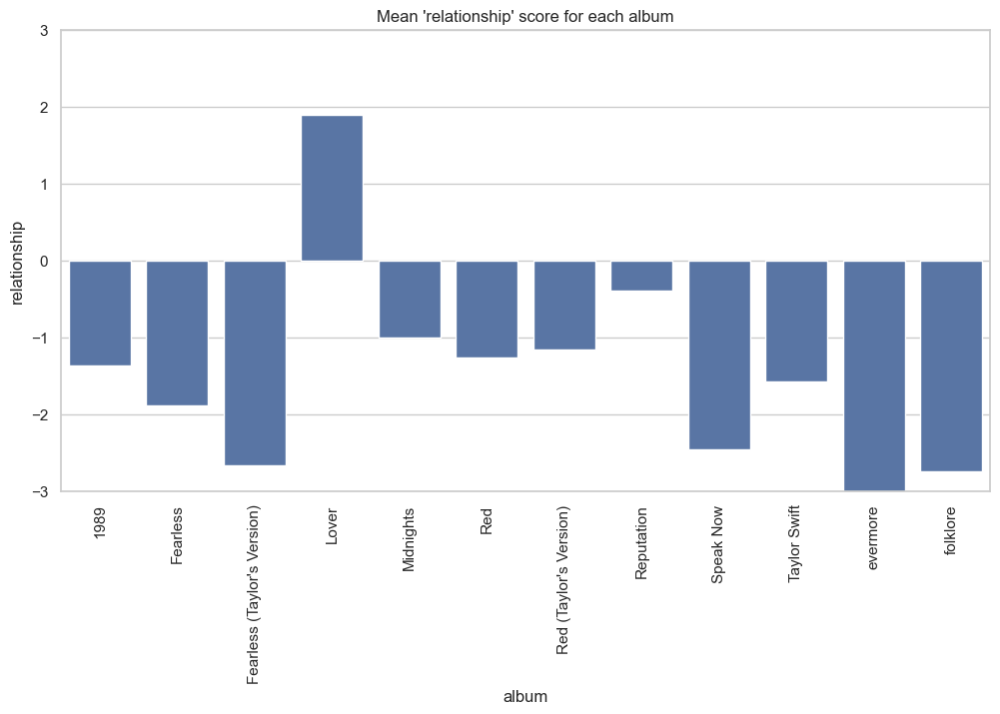

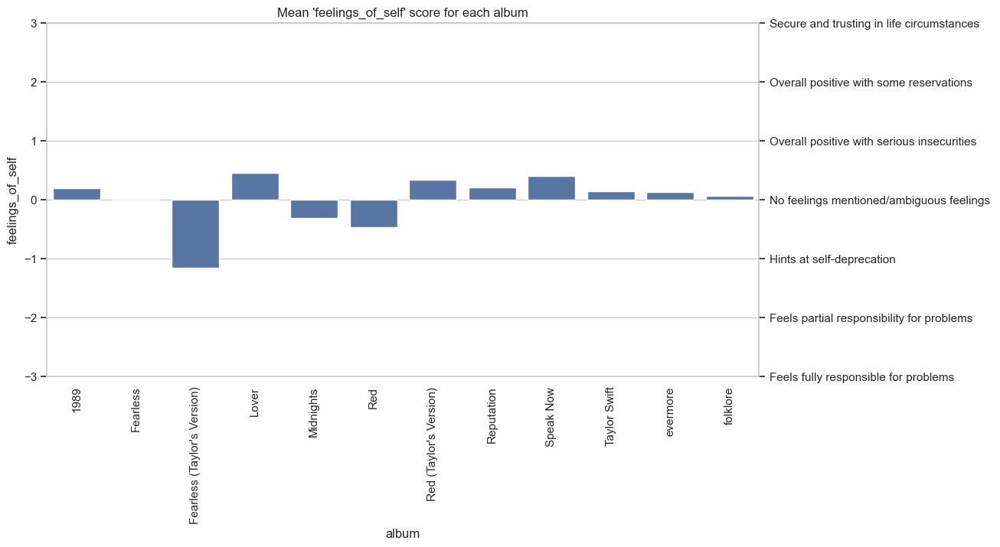

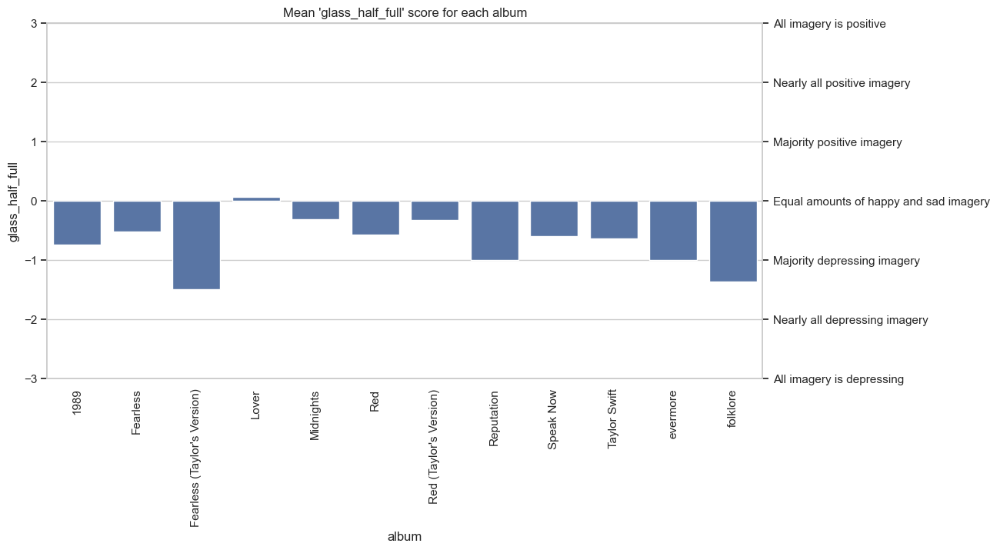

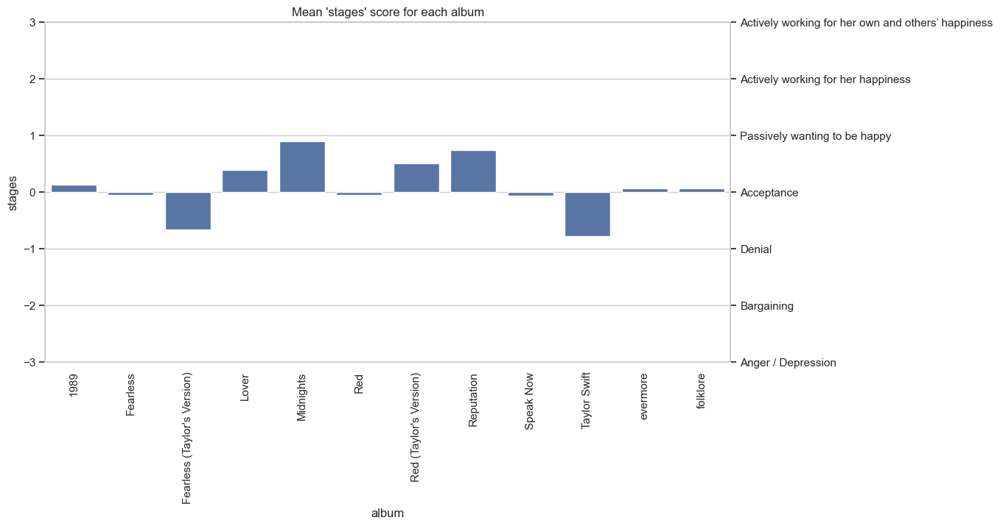

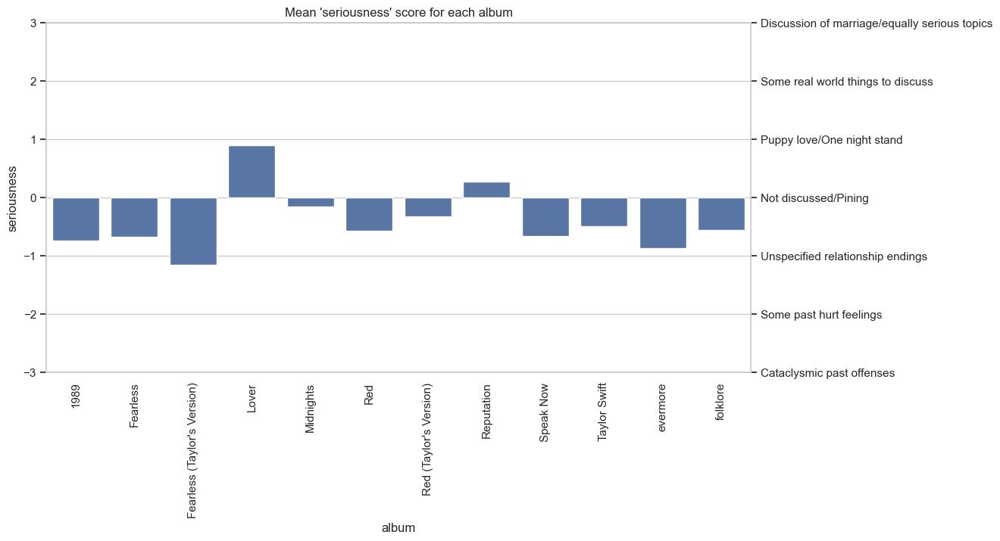

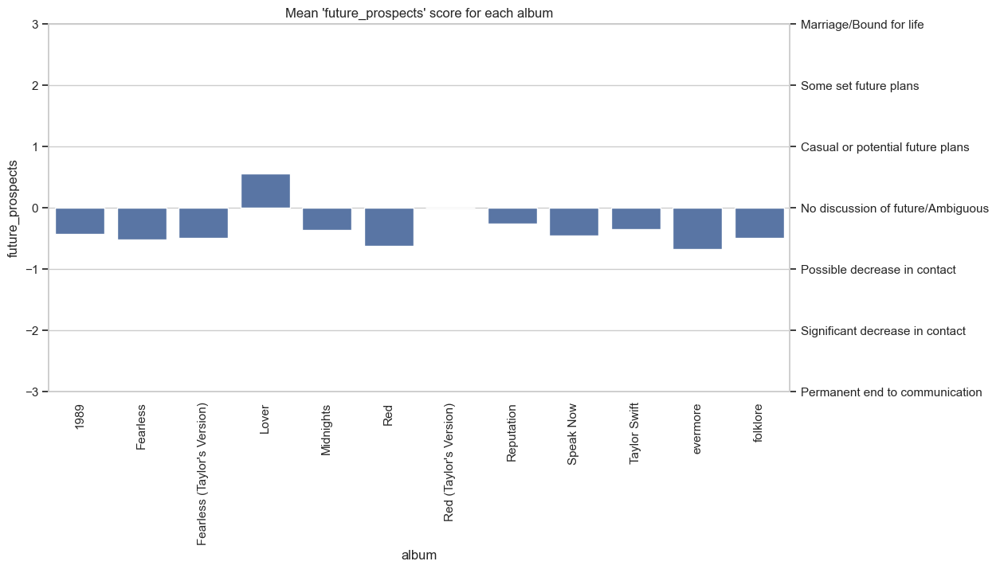

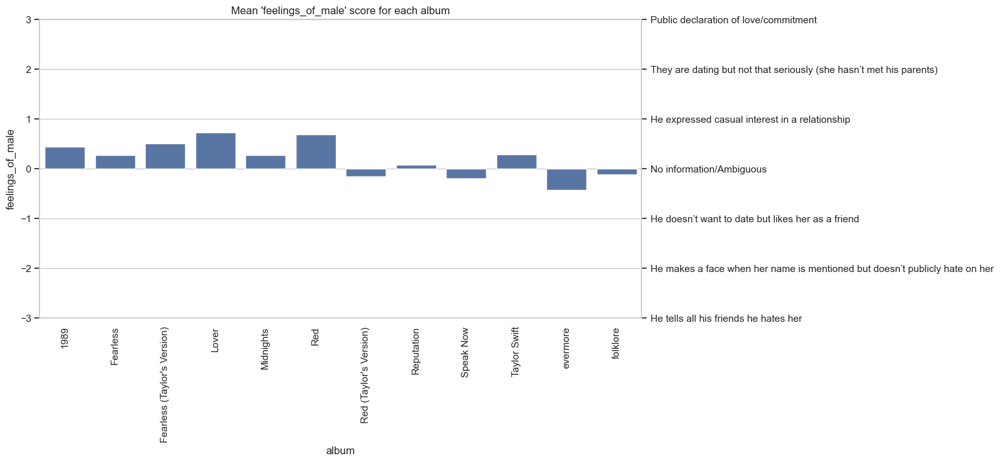

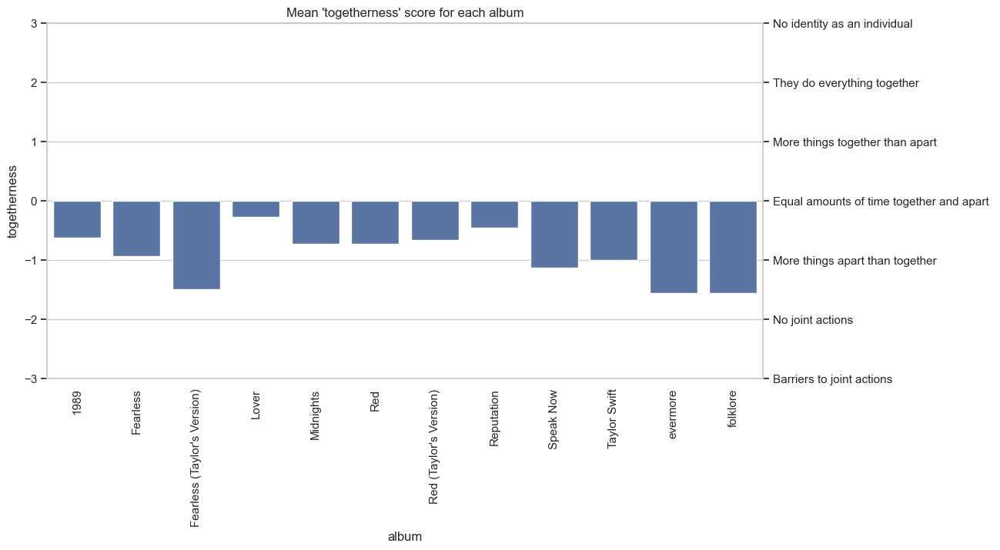

In [102]:
ignore_cols = ['song_name', 'tempo', 'spotify_uri', 'url']
album_scores = df_scores.drop(columns=ignore_cols).groupby('album').agg(['mean'])
album_scores = album_scores.droplevel(1, axis=1)
album_scores = album_scores.reindex_like(album_scores)
display(album_scores)
# For each column plot the value of the mean for each album
for col in album_scores.columns:
    plt.figure(figsize=(12, 6))
    # set max and min value to -3 and 3
    plt.ylim(-3, 3)
    sns.barplot(x=album_scores.index, y=album_scores[col])
    plt.title(f"Mean '{col}' score for each album")
    plt.xticks(rotation=90)

    apply_desc_y_axis_to_axis(plt.gca(), df_criteria, col) 
    plt.savefig(f'plots/mean_{col}_score_per_album.png', dpi=300, bbox_inches = 'tight')
    plt.show()

In [103]:
# Get top k songs based on column name
def get_top_k_songs(df, column_name, k):
    return df.nlargest(k, column_name)[['song_name', 'album', column_name]]

# Get bottom k songs based on column name
def get_bottom_k_songs(df, column_name, k):
    return df.nsmallest(k, column_name)[['song_name', 'album', column_name]]

def get_all_songs_with_value(df, column_name, value):
    return df[df[column_name] == value][['song_name', 'album', column_name]]

In [104]:
def get_top_bottom_k_songs(df, column_name, k):
    top_k = get_top_k_songs(df, column_name, k)
    bottom_k = get_bottom_k_songs(df, column_name, k)
    return top_k, bottom_k

In [105]:
k = 5
happy_k, sad_k = get_top_bottom_k_songs(df_scores, 'happy_sad', k)
print(f'Top {k} happiest songs')
display(happy_k)
print('Top 5 saddest songs')
display(sad_k)
relationship_k, no_relationship_k = get_top_bottom_k_songs(df_scores, 'relationship', k)
print(f'Top {k} songs about relationship')
display(relationship_k)
print('Top 5 songs without relationship')
display(no_relationship_k)

Top 5 happiest songs


,song_name,album,happy_sad
105,i think he knows,Lover,11
111,paper rings,Lover,11
1,i'm only me when i'm with you,Taylor Swift,9
43,ours,Speak Now,9
52,everything has changed,Red,9


Top 5 saddest songs


,song_name,album,happy_sad
56,i knew you were trouble,Red,-12
0,cold as you,Taylor Swift,-10
30,white horse,Fearless,-9
160,all too well (10 minute version),Red (Taylor's Version),-9
97,this is why we can't have nice things,Reputation,-8


Top 5 songs about relationship


,song_name,album,relationship
3,mary's song,Taylor Swift,12
106,it's nice to have a friend,Lover,11
108,lover,Lover,11
1,i'm only me when i'm with you,Taylor Swift,10
24,love story,Fearless,10


Top 5 songs without relationship


,song_name,album,relationship
68,bad blood,1989,-11
94,look what you made me do,Reputation,-11
97,this is why we can't have nice things,Reputation,-11
144,"no body, no crime",evermore,-11
22,i heart ?,Fearless,-10


In [106]:
# Getting all songs with max/min value
max_happy_sad = df_scores['happy_sad'].max()
min_happy_sad = df_scores['happy_sad'].min()
max_relationship = df_scores['relationship'].max()
min_relationship = df_scores['relationship'].min()
happy_songs = get_all_songs_with_value(df_scores, 'happy_sad', max_happy_sad)
sad_songs = get_all_songs_with_value(df_scores, 'happy_sad', min_happy_sad)
relationship_songs = get_all_songs_with_value(df_scores, 'relationship', max_relationship)
no_relationship_songs = get_all_songs_with_value(df_scores, 'relationship', min_relationship)
print(f'All songs with max happy_sad value')
display(happy_songs)
print(f'All songs with min happy_sad value')
display(sad_songs)
print(f'All songs with max relationship value')
display(relationship_songs)
print(f'All songs with min relationship value')
display(no_relationship_songs)

cols = list(df_scores.columns)[3:]
for col in cols:
    max_col, min_col = df_scores[col].max(), df_scores[col].min()
    print(f'Top songs with highest {col} score')
    display(get_all_songs_with_value(df_scores, col, max_col))
    print(f'Top songs with lowest {col} score')
    display(get_all_songs_with_value(df_scores, col, min_col))


All songs with max happy_sad value


,song_name,album,happy_sad
105,i think he knows,Lover,11
111,paper rings,Lover,11


All songs with min happy_sad value


,song_name,album,happy_sad
56,i knew you were trouble,Red,-12


All songs with max relationship value


,song_name,album,relationship
3,mary's song,Taylor Swift,12


All songs with min relationship value


,song_name,album,relationship
68,bad blood,1989,-11
94,look what you made me do,Reputation,-11
97,this is why we can't have nice things,Reputation,-11
144,"no body, no crime",evermore,-11


Top songs with highest relationship score


,song_name,album,relationship
3,mary's song,Taylor Swift,12


Top songs with lowest relationship score


,song_name,album,relationship
68,bad blood,1989,-11
94,look what you made me do,Reputation,-11
97,this is why we can't have nice things,Reputation,-11
144,"no body, no crime",evermore,-11


Top songs with highest feelings_of_self score


,song_name,album,feelings_of_self
1,i'm only me when i'm with you,Taylor Swift,3
7,picture to burn,Taylor Swift,3
16,change,Fearless,3
18,fearless,Fearless,3
21,hey stephen,Fearless,3
43,ours,Speak Now,3
45,speak now,Speak Now,3
52,everything has changed,Red,3
66,we are never ever getting back together,Red,3
68,bad blood,1989,3


Top songs with lowest feelings_of_self score


,song_name,album,feelings_of_self
12,tied together with a smile,Taylor Swift,-3
15,breathe,Fearless,-3
30,white horse,Fearless,-3
33,back to december,Speak Now,-3
51,come back...be here,Red,-3
56,i knew you were trouble,Red,-3
77,style,1989,-3
87,don't blame me,Reputation,-3
98,afterglow,Lover,-3
113,the archer,Lover,-3


Top songs with highest glass_half_full score


,song_name,album,glass_half_full
1,i'm only me when i'm with you,Taylor Swift,3
18,fearless,Fearless,3
21,hey stephen,Fearless,3
52,everything has changed,Red,3
62,starlight,Red,3
105,i think he knows,Lover,3
107,london boy,Lover,3
111,paper rings,Lover,3


Top songs with lowest glass_half_full score


,song_name,album,glass_half_full
0,cold as you,Taylor Swift,-3
5,the outside,Taylor Swift,-3
6,a perfectly good heart,Taylor Swift,-3
12,tied together with a smile,Taylor Swift,-3
15,breathe,Fearless,-3
27,tell me why,Fearless,-3
30,white horse,Fearless,-3
32,you're not sorry,Fearless,-3
33,back to december,Speak Now,-3
34,better than revenge,Speak Now,-3


Top songs with highest stages score


,song_name,album,stages
16,change,Fearless,3
24,love story,Fearless,3
43,ours,Speak Now,3
45,speak now,Speak Now,3
52,everything has changed,Red,3
53,girl at home,Red,3
72,i know places,1989,3
94,look what you made me do,Reputation,3
95,new year's day,Reputation,3
105,i think he knows,Lover,3


Top songs with lowest stages score


,song_name,album,stages
0,cold as you,Taylor Swift,-3
7,picture to burn,Taylor Swift,-3
9,should've said no,Taylor Swift,-3
11,teardrops on my guitar,Taylor Swift,-3
15,breathe,Fearless,-3
20,forever & always,Fearless,-3
25,the other side of the door,Fearless,-3
27,tell me why,Fearless,-3
30,white horse,Fearless,-3
32,you're not sorry,Fearless,-3


Top songs with highest tempo score


,song_name,album,tempo
7,picture to burn,Taylor Swift,3
41,mean,Speak Now,3
62,starlight,Red,3
64,stay stay stay,Red,3


Top songs with lowest tempo score


,song_name,album,tempo
0,cold as you,Taylor Swift,-3
56,i knew you were trouble,Red,-3
94,look what you made me do,Reputation,-3
97,this is why we can't have nice things,Reputation,-3
144,"no body, no crime",evermore,-3
160,all too well (10 minute version),Red (Taylor's Version),-3


Top songs with highest seriousness score


,song_name,album,seriousness
3,mary's song,Taylor Swift,3
24,love story,Fearless,3
42,mine,Speak Now,3
72,i know places,1989,3
106,it's nice to have a friend,Lover,3
108,lover,Lover,3
128,peace,folklore,3
131,the last great american dynasty,folklore,3


Top songs with lowest seriousness score


,song_name,album,seriousness
0,cold as you,Taylor Swift,-3
7,picture to burn,Taylor Swift,-3
20,forever & always,Fearless,-3
34,better than revenge,Speak Now,-3
37,haunted,Speak Now,-3
41,mean,Speak Now,-3
56,i knew you were trouble,Red,-3
59,the moment i knew,Red,-3
67,all you had to do was stay,1989,-3
68,bad blood,1989,-3


Top songs with highest future_prospects score


,song_name,album,future_prospects
3,mary's song,Taylor Swift,3
24,love story,Fearless,3
42,mine,Speak Now,3
62,starlight,Red,3
101,daylight,Lover,3
106,it's nice to have a friend,Lover,3
108,lover,Lover,3
111,paper rings,Lover,3
173,the great war,Midnights,3


Top songs with lowest future_prospects score


,song_name,album,future_prospects
0,cold as you,Taylor Swift,-3
7,picture to burn,Taylor Swift,-3
9,should've said no,Taylor Swift,-3
22,i heart ?,Fearless,-3
26,superstar,Fearless,-3
30,white horse,Fearless,-3
32,you're not sorry,Fearless,-3
35,dear john,Speak Now,-3
41,mean,Speak Now,-3
53,girl at home,Red,-3


Top songs with highest feelings_of_male score


,song_name,album,feelings_of_male
1,i'm only me when i'm with you,Taylor Swift,3
3,mary's song,Taylor Swift,3
4,our song,Taylor Swift,3
24,love story,Fearless,3
30,white horse,Fearless,3
31,you belong with me,Fearless,3
42,mine,Speak Now,3
43,ours,Speak Now,3
45,speak now,Speak Now,3
52,everything has changed,Red,3


Top songs with lowest feelings_of_male score


,song_name,album,feelings_of_male
22,i heart ?,Fearless,-3
35,dear john,Speak Now,-3
37,haunted,Speak Now,-3
68,bad blood,1989,-3
94,look what you made me do,Reputation,-3
97,this is why we can't have nice things,Reputation,-3
115,you need to calm down,Lover,-3
122,hoax,folklore,-3
125,mad woman,folklore,-3
127,my tears ricochet,folklore,-3


Top songs with highest togetherness score


,song_name,album,togetherness
1,i'm only me when i'm with you,Taylor Swift,3
3,mary's song,Taylor Swift,3
15,breathe,Fearless,3
157,forever winter,Red (Taylor's Version),3


Top songs with lowest togetherness score


,song_name,album,togetherness
2,invisible,Taylor Swift,-3
7,picture to burn,Taylor Swift,-3
9,should've said no,Taylor Swift,-3
11,teardrops on my guitar,Taylor Swift,-3
26,superstar,Fearless,-3
29,the way i loved you,Fearless,-3
30,white horse,Fearless,-3
34,better than revenge,Speak Now,-3
47,superman,Speak Now,-3
51,come back...be here,Red,-3


Top songs with highest spotify_uri score


,song_name,album,spotify_uri
57,the last time,Red,7vvIpJZye5cRR6De1LKM0m


Top songs with lowest spotify_uri score


,song_name,album,spotify_uri
15,breathe,Fearless,-
22,i heart ?,Fearless,-
153,don't you,Fearless (Taylor's Version),-


Top songs with highest url score


,song_name,album,url
57,the last time,Red,https://open.spotify.com/track/7vvIpJZye5cRR6D...


Top songs with lowest url score


,song_name,album,url
15,breathe,Fearless,-
153,don't you,Fearless (Taylor's Version),-


In [107]:
cols = ['happy_sad','relationship']
cols.extend(criteria)
for col in cols:
    print(f'Top {k} songs with highest {col} score')
    top_k, low_k = get_top_bottom_k_songs(df_scores, col, k)
    display(top_k)
    print(f'Top {k} songs with lowest {col} score')
    display(low_k)

Top 5 songs with highest happy_sad score


,song_name,album,happy_sad
105,i think he knows,Lover,11
111,paper rings,Lover,11
1,i'm only me when i'm with you,Taylor Swift,9
43,ours,Speak Now,9
52,everything has changed,Red,9


Top 5 songs with lowest happy_sad score


,song_name,album,happy_sad
56,i knew you were trouble,Red,-12
0,cold as you,Taylor Swift,-10
30,white horse,Fearless,-9
160,all too well (10 minute version),Red (Taylor's Version),-9
97,this is why we can't have nice things,Reputation,-8


Top 5 songs with highest relationship score


,song_name,album,relationship
3,mary's song,Taylor Swift,12
106,it's nice to have a friend,Lover,11
108,lover,Lover,11
1,i'm only me when i'm with you,Taylor Swift,10
24,love story,Fearless,10


Top 5 songs with lowest relationship score


,song_name,album,relationship
68,bad blood,1989,-11
94,look what you made me do,Reputation,-11
97,this is why we can't have nice things,Reputation,-11
144,"no body, no crime",evermore,-11
22,i heart ?,Fearless,-10


Top 5 songs with highest feelings_of_self score


,song_name,album,feelings_of_self
1,i'm only me when i'm with you,Taylor Swift,3
7,picture to burn,Taylor Swift,3
16,change,Fearless,3
18,fearless,Fearless,3
21,hey stephen,Fearless,3


Top 5 songs with lowest feelings_of_self score


,song_name,album,feelings_of_self
12,tied together with a smile,Taylor Swift,-3
15,breathe,Fearless,-3
30,white horse,Fearless,-3
33,back to december,Speak Now,-3
51,come back...be here,Red,-3


Top 5 songs with highest glass_half_full score


,song_name,album,glass_half_full
1,i'm only me when i'm with you,Taylor Swift,3
18,fearless,Fearless,3
21,hey stephen,Fearless,3
52,everything has changed,Red,3
62,starlight,Red,3


Top 5 songs with lowest glass_half_full score


,song_name,album,glass_half_full
0,cold as you,Taylor Swift,-3
5,the outside,Taylor Swift,-3
6,a perfectly good heart,Taylor Swift,-3
12,tied together with a smile,Taylor Swift,-3
15,breathe,Fearless,-3


Top 5 songs with highest stages score


,song_name,album,stages
16,change,Fearless,3
24,love story,Fearless,3
43,ours,Speak Now,3
45,speak now,Speak Now,3
52,everything has changed,Red,3


Top 5 songs with lowest stages score


,song_name,album,stages
0,cold as you,Taylor Swift,-3
7,picture to burn,Taylor Swift,-3
9,should've said no,Taylor Swift,-3
11,teardrops on my guitar,Taylor Swift,-3
15,breathe,Fearless,-3


Top 5 songs with highest tempo score


,song_name,album,tempo
7,picture to burn,Taylor Swift,3
41,mean,Speak Now,3
62,starlight,Red,3
64,stay stay stay,Red,3
1,i'm only me when i'm with you,Taylor Swift,2


Top 5 songs with lowest tempo score


,song_name,album,tempo
0,cold as you,Taylor Swift,-3
56,i knew you were trouble,Red,-3
94,look what you made me do,Reputation,-3
97,this is why we can't have nice things,Reputation,-3
144,"no body, no crime",evermore,-3


Top 5 songs with highest seriousness score


,song_name,album,seriousness
3,mary's song,Taylor Swift,3
24,love story,Fearless,3
42,mine,Speak Now,3
72,i know places,1989,3
106,it's nice to have a friend,Lover,3


Top 5 songs with lowest seriousness score


,song_name,album,seriousness
0,cold as you,Taylor Swift,-3
7,picture to burn,Taylor Swift,-3
20,forever & always,Fearless,-3
34,better than revenge,Speak Now,-3
37,haunted,Speak Now,-3


Top 5 songs with highest future_prospects score


,song_name,album,future_prospects
3,mary's song,Taylor Swift,3
24,love story,Fearless,3
42,mine,Speak Now,3
62,starlight,Red,3
101,daylight,Lover,3


Top 5 songs with lowest future_prospects score


,song_name,album,future_prospects
0,cold as you,Taylor Swift,-3
7,picture to burn,Taylor Swift,-3
9,should've said no,Taylor Swift,-3
22,i heart ?,Fearless,-3
26,superstar,Fearless,-3


Top 5 songs with highest feelings_of_male score


,song_name,album,feelings_of_male
1,i'm only me when i'm with you,Taylor Swift,3
3,mary's song,Taylor Swift,3
4,our song,Taylor Swift,3
24,love story,Fearless,3
30,white horse,Fearless,3


Top 5 songs with lowest feelings_of_male score


,song_name,album,feelings_of_male
22,i heart ?,Fearless,-3
35,dear john,Speak Now,-3
37,haunted,Speak Now,-3
68,bad blood,1989,-3
94,look what you made me do,Reputation,-3


Top 5 songs with highest togetherness score


,song_name,album,togetherness
1,i'm only me when i'm with you,Taylor Swift,3
3,mary's song,Taylor Swift,3
15,breathe,Fearless,3
157,forever winter,Red (Taylor's Version),3
18,fearless,Fearless,2


Top 5 songs with lowest togetherness score


,song_name,album,togetherness
2,invisible,Taylor Swift,-3
7,picture to burn,Taylor Swift,-3
9,should've said no,Taylor Swift,-3
11,teardrops on my guitar,Taylor Swift,-3
26,superstar,Fearless,-3


In [108]:
# Most neutral song
neutral_songs = get_all_songs_with_value(df_scores, 'happy_sad', 0)
print('All neutral songs')
display(neutral_songs)

# Most neutral songs about relationship
neutral_relationship_songs = get_all_songs_with_value(df_scores, 'relationship', 0)
print('All neutral songs about relationship')
display(neutral_relationship_songs)

All neutral songs


,song_name,album,happy_sad
31,you belong with me,Fearless,0
70,clean,1989,0
99,cornelia street,Lover,0
101,daylight,Lover,0
117,august,folklore,0
121,exile,folklore,0
125,mad woman,folklore,0
134,closure,evermore,0
136,cowboy like me,evermore,0
162,maroon,Midnights,0


All neutral songs about relationship


,song_name,album,relationship
16,change,Fearless,0
21,hey stephen,Fearless,0
23,jump then fall,Fearless,0
57,the last time,Red,0
81,wonderland,1989,0
83,...ready for it?,Reputation,0


feelings_of_self
-1    22.346369
 0    18.435754
 3    14.525140
 1    12.849162
-2    11.173184
 2    10.614525
-3    10.055866
Name: count, dtype: float64

feelings_of_self
-1    22.346369
 0    18.435754
 3    14.525140
 1    12.849162
-2    11.173184
 2    10.614525
-3    10.055866
Name: count, dtype: float64

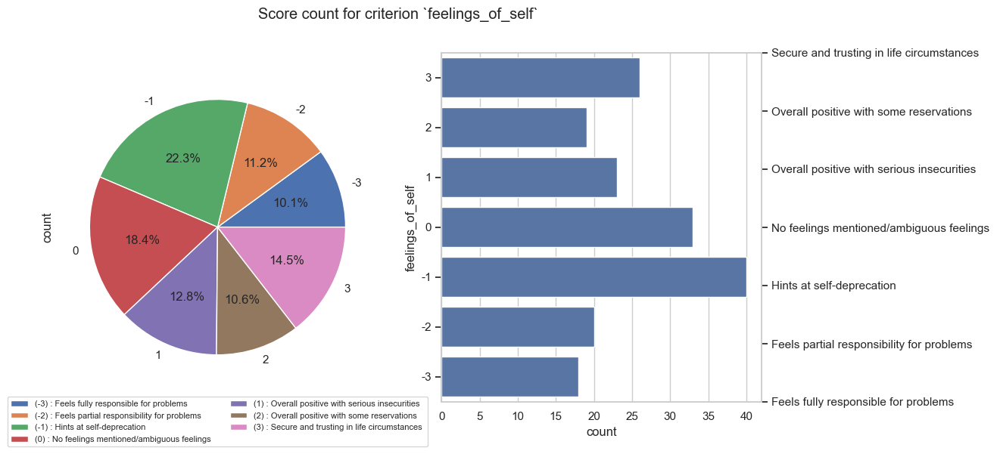

glass_half_full
-2    23.463687
-3    17.318436
-1    16.759777
 0    13.966480
 1    12.849162
 2    11.173184
 3     4.469274
Name: count, dtype: float64

glass_half_full
-2    23.463687
-3    17.318436
-1    16.759777
 0    13.966480
 1    12.849162
 2    11.173184
 3     4.469274
Name: count, dtype: float64

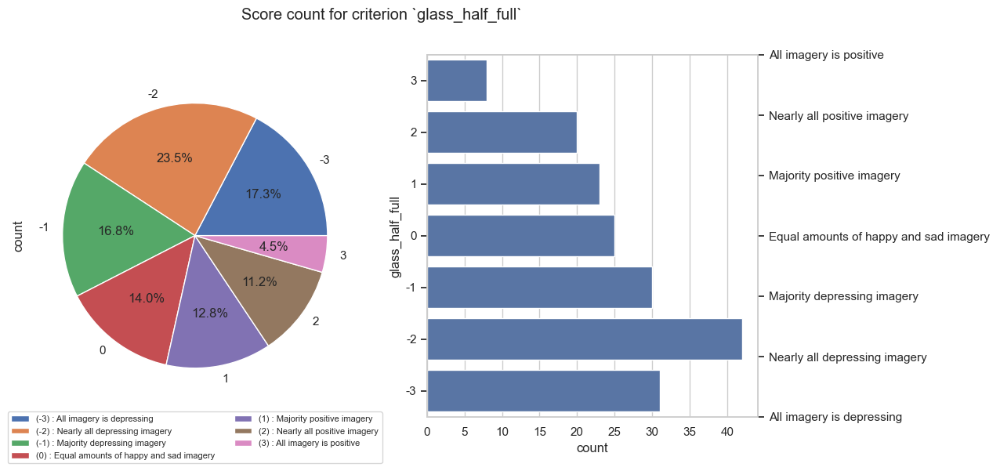

stages
 1    26.815642
-3    17.318436
 2    14.525140
 0    14.525140
 3    11.173184
-2     8.379888
-1     7.262570
Name: count, dtype: float64

stages
 1    26.815642
-3    17.318436
 0    14.525140
 2    14.525140
 3    11.173184
-2     8.379888
-1     7.262570
Name: count, dtype: float64

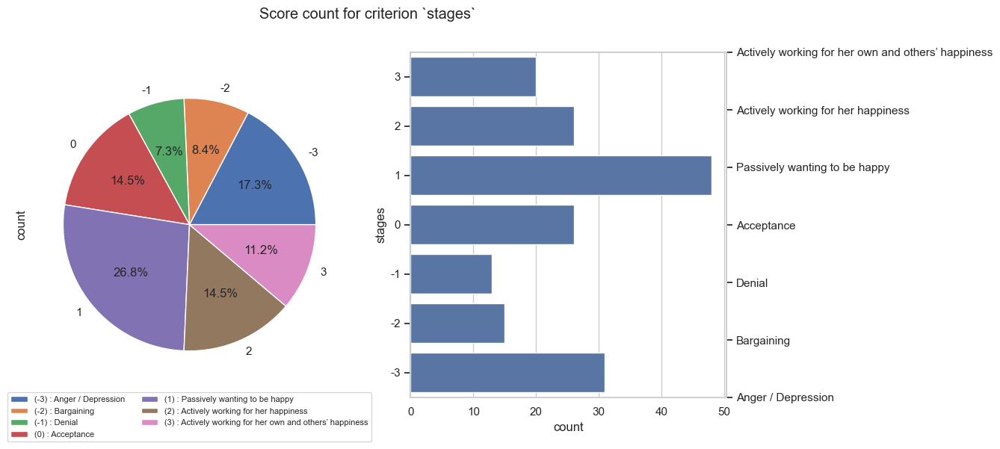

seriousness
-1    20.670391
-2    18.994413
 0    16.201117
 2    14.525140
 1    13.407821
-3    11.731844
 3     4.469274
Name: count, dtype: float64

seriousness
-1    20.670391
-2    18.994413
 0    16.201117
 2    14.525140
 1    13.407821
-3    11.731844
 3     4.469274
Name: count, dtype: float64

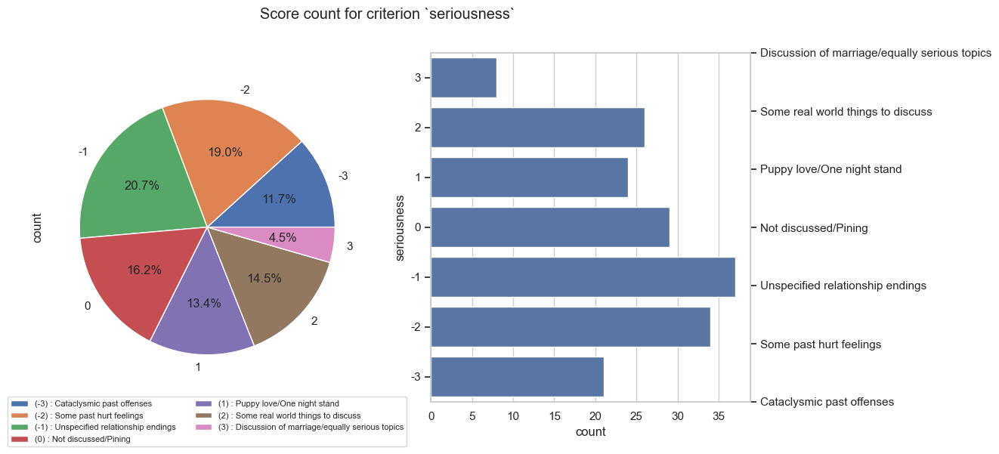

future_prospects
 0    34.636872
-3    17.318436
 2    15.083799
-2    12.290503
-1    10.055866
 1     5.586592
 3     5.027933
Name: count, dtype: float64

future_prospects
 0    34.636872
-3    17.318436
 2    15.083799
-2    12.290503
-1    10.055866
 1     5.586592
 3     5.027933
Name: count, dtype: float64

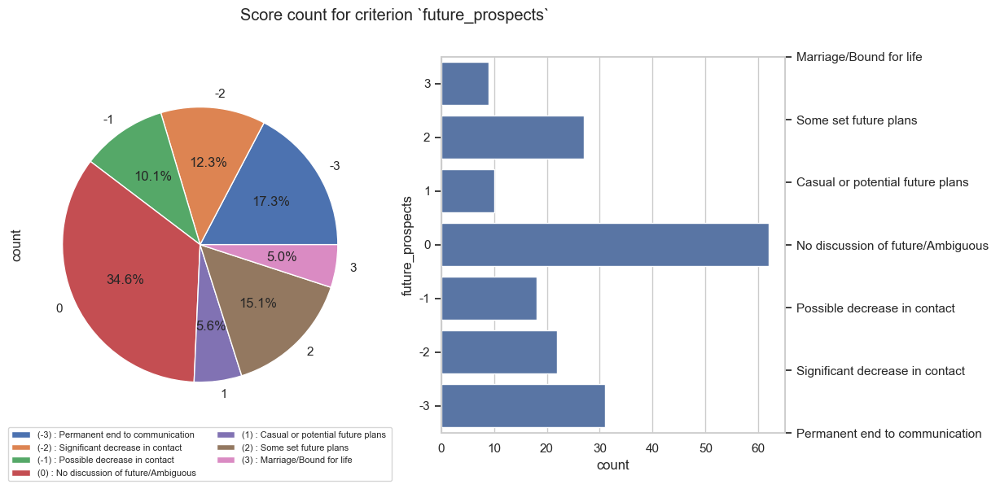

feelings_of_male
 0    44.692737
 3    13.407821
 1    11.731844
-2    10.055866
 2     7.262570
-1     6.703911
-3     6.145251
Name: count, dtype: float64

feelings_of_male
 0    44.692737
 3    13.407821
 1    11.731844
-2    10.055866
 2     7.262570
-1     6.703911
-3     6.145251
Name: count, dtype: float64

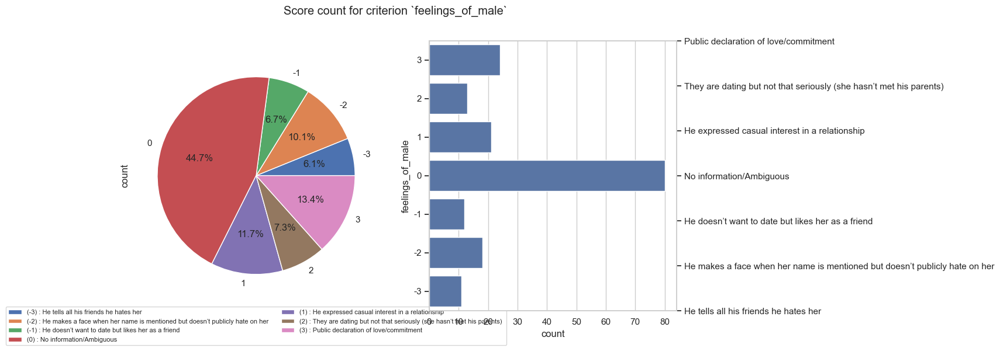

togetherness
-1    30.167598
-2    25.139665
-3    15.083799
 1    10.614525
 2     8.938547
 0     7.821229
 3     2.234637
Name: count, dtype: float64

togetherness
-1    30.167598
-2    25.139665
-3    15.083799
 1    10.614525
 2     8.938547
 0     7.821229
 3     2.234637
Name: count, dtype: float64

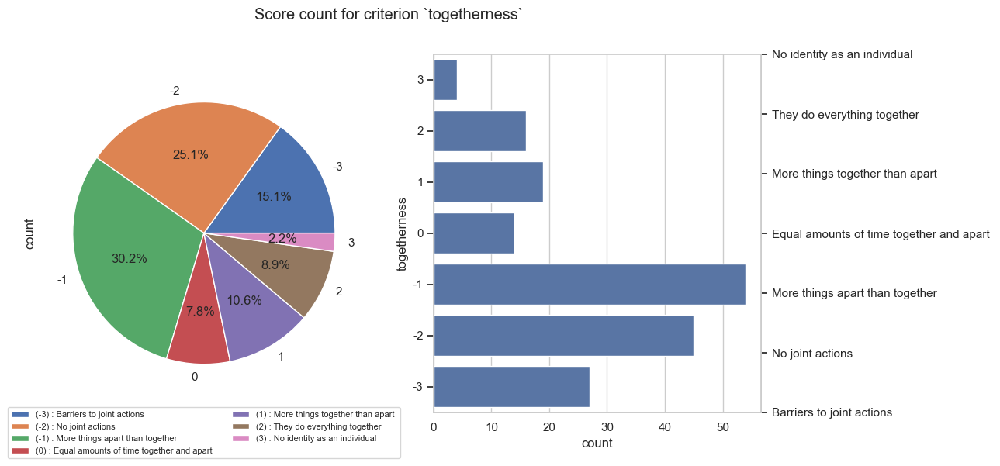

In [115]:
# Plot songs count for each value of each column
for col in [c for c in cols if c not in ['happy_sad', 'relationship', 'tempo']]:

    #print count of each score for each criterion
    display(df_scores[col].value_counts()/df_scores[col].count() * 100)

    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle(f'Score count for criterion `{col}`')
    plt.subplots_adjust(wspace=0.2) 
    labels = [f'({score}) : {desc}' for
                 score, desc in zip(df_criteria[df_criteria['criterion'] == col]['score'], 
                                    df_criteria[df_criteria['criterion'] == col]['description'])]
    #sort df based on score
    # sort df score based on index value from high to low
    df_scores = df_scores.sort_values(by=col, ascending=True)
    display(df_scores[col].value_counts()/df_scores[col].count() * 100)
    # create array from -3 to +3 to be used as x-axis
    ticks_range = range(-3,3+1, 1)
    sns.countplot(y=col, data=df_scores, legend=False, ax=ax[1], order=ticks_range)
    ax[1].invert_yaxis()
    apply_desc_y_axis_to_axis(ax[1], df_criteria, col)
    # reverse the order of the legend
    # get pie val by sorting based on the score
    df_scores[col].value_counts().sort_index().plot.pie(ax=ax[0], autopct='%1.1f%%')
    ax[0].legend(labels, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=2, fontsize=8)
    fig.savefig(f'plots/score_count_{col}.png', dpi=300, bbox_inches = 'tight')
    plt.show()

# Lyrical analysis

In [98]:
stop_words_ext = []
with open('data/en-stopwrods-extended.txt') as f:
    stop_words_ext = f.read().splitlines()
stop_words_ext[:10]

["'ll", "'tis", "'twas", "'ve", "'s", "'m", "'d", "'re", '"', '`']

In [99]:
# Extending the english stopwords list
words_extended = list(stopwords.words('english'))
words_extended.extend(list(stop_words_ext))

In [100]:
def get_top_n_items(dictionary, n):
    sorted_items = sorted(dictionary.items(), key=lambda x: x[1], reverse=True)
    return sorted_items[:n]

## Using DistilRoBERTa-base to detect emotions

In [22]:
! pip install torch
! pip install transformers


[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


In [23]:
from transformers import pipeline
model = pipeline("text-classification", model="j-hartmann/emotion-english-distilroberta-base")

/Users/canova/Desktop/Uni/Aalto/Statistical Natural Language Processing/proj/Taylor-s-Tune/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [24]:
def get_lyrics_scores_ROBERTA(lyrics):
    words = word_tokenize(lyrics.lower())
    filtered_words = [word for word in words if word not in words_extended]
    scores = model(''.join(filtered_words))
    return scores[0]

In [25]:
song_test = df_full.iloc[37]
print(song_test['song_name'])
print(get_lyrics_scores_ROBERTA(song_test['lyrics']))

haunted
{'label': 'fear', 'score': 0.7547958493232727}


In [26]:
df_copy = df_full.copy()
# For each song in the dataframe create 3 column each one for the top 3 emotions
df_copy['Top 1 Emotion'] = ''
df_copy['Top 1 Emotion Score'] = 0

for index, row in df_copy.iterrows():
    score = get_lyrics_scores_ROBERTA(row['lyrics'])
    # Check len of top_3_emotions if less than 3 add empty values
    df_copy.at[index, 'Top 1 Emotion'] = score['label']
    df_copy.at[index, 'Top 1 Emotion Score'] = score['score']

df_copy

/var/folders/97/yjfp60y90vvgjz812_bx179m0000gn/T/ipykernel_11446/3671287957.py:10: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.6737728714942932' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_copy.at[index, 'Top 1 Emotion Score'] = score['score']


,song_name,album,happy_sad,relationship,feelings_of_self,glass_half_full,stages,tempo,seriousness,future_prospects,feelings_of_male,togetherness,lyrics,spotify_uri,url,Top 1 Emotion,Top 1 Emotion Score
0,cold as you,Taylor Swift,-10,-8,-1,-3,-3,-3,-3,-3,-1,-1,You have a way of coming easily to me\r\n And ...,7an1exwMnfYRcdVQm0yDev,https://open.spotify.com/track/7an1exwMnfYRcdV...,joy,0.673773
1,i'm only me when i'm with you,Taylor Swift,9,10,3,3,1,2,2,2,3,3,Friday night beneath the stars\r\n In a field ...,0JIdBrXGSJXS72zjF9ss9u,https://open.spotify.com/track/0JIdBrXGSJXS72z...,surprise,0.324077
2,invisible,Taylor Swift,-1,-4,0,-2,1,0,0,0,-1,-3,She can't see the way your eyes\r\n Light up w...,5OOd01o2YS1QFwdpVLds3r,https://open.spotify.com/track/5OOd01o2YS1QFwd...,joy,0.739232
3,mary's song,Taylor Swift,5,12,0,2,1,2,3,3,3,3,She said I was seven and you were nine\r\n I l...,2QrQCMel6v2JiLxqrg4p2O,https://open.spotify.com/track/2QrQCMel6v2JiLx...,joy,0.448086
4,our song,Taylor Swift,5,6,2,2,1,0,1,1,3,1,I was ridin' shotgun with my hair undone\r\n I...,15DeqWWQB4dcEWzJg15VrN,https://open.spotify.com/track/15DeqWWQB4dcEWz...,joy,0.294866
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,paris,Midnights,6,6,1,2,1,2,1,2,1,2,"""Your ex-friend's sister\r\n Met someone at a ...",5tWxKWq1DSP1s9WQ5PWuqu,https://open.spotify.com/track/5tWxKWq1DSP1s9W...,sadness,0.458120
176,high infidelity,Midnights,-1,-9,-2,-1,2,0,-2,-2,-2,-3,"Lock broken, slur spoken\r\n Wound open, game ...",5kiZGSxgqPdv6rbqL9THdd,https://open.spotify.com/track/5kiZGSxgqPdv6rb...,joy,0.363597
177,glitch,Midnights,1,7,1,1,-1,0,2,2,2,1,We were supposed to be just friends\r\n You do...,7C0w28EsX0Um2FrZs9gso2,https://open.spotify.com/track/7C0w28EsX0Um2Fr...,joy,0.438239
178,"would've, could've, should've",Midnights,-3,-4,-2,-1,-2,2,-2,-1,0,-1,"If you would've blinked, then I would've\r\n L...",4txojlesMFQZGWxwz2EeqB,https://open.spotify.com/track/4txojlesMFQZGWx...,sadness,0.349882


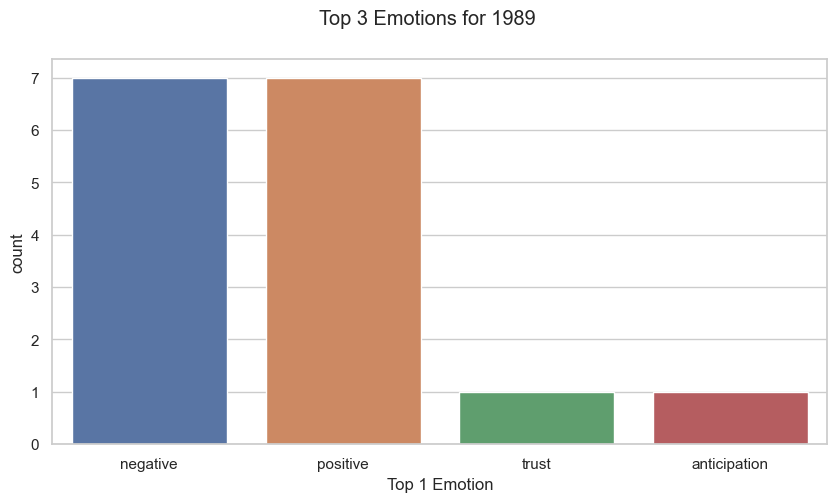

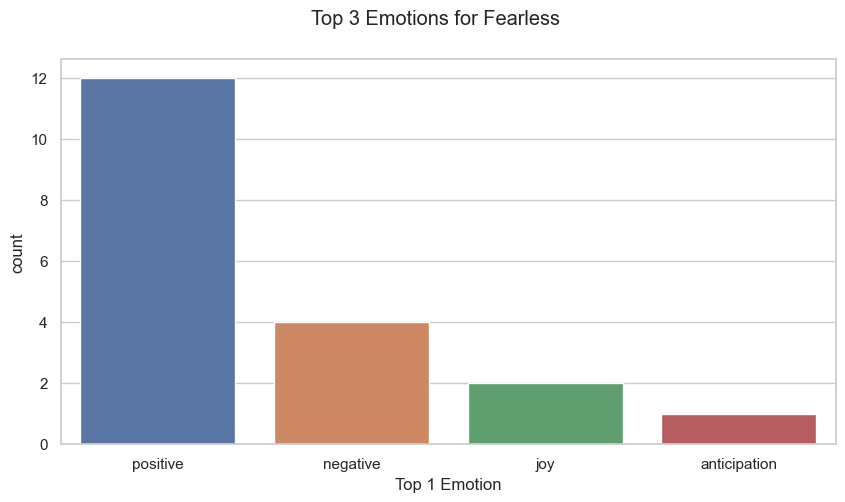

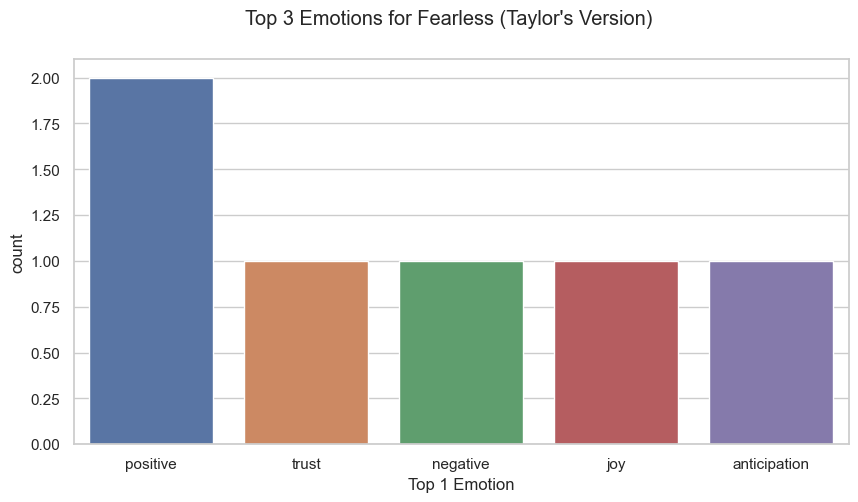

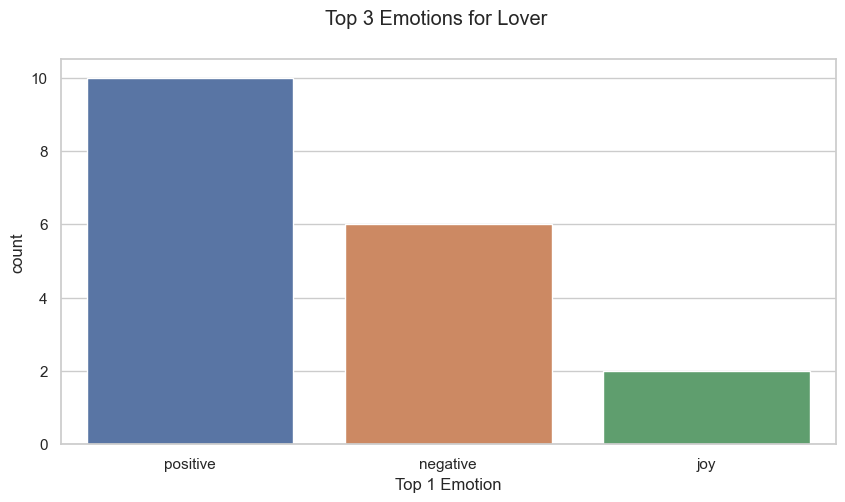

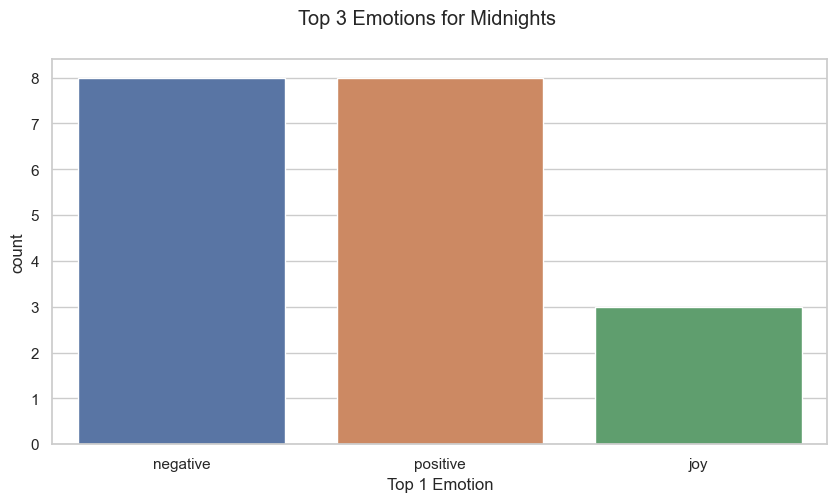

...

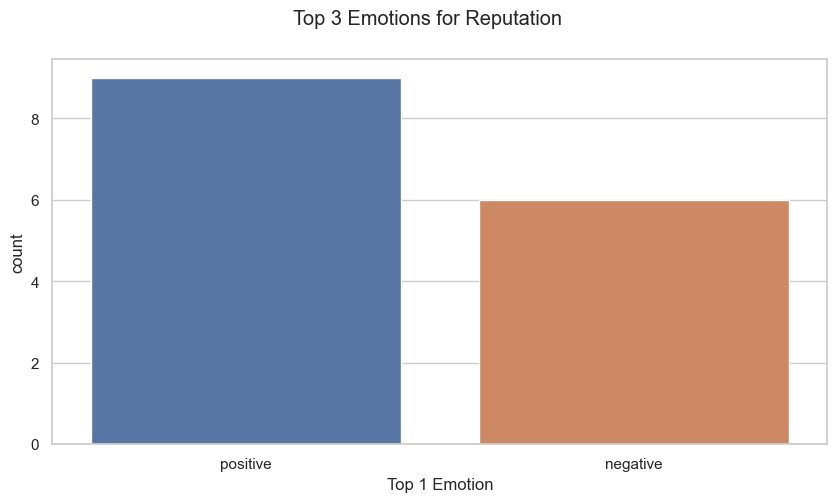

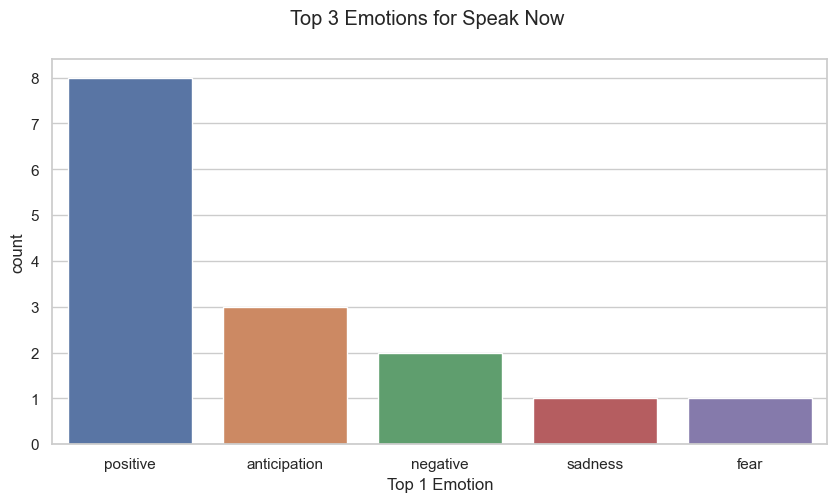

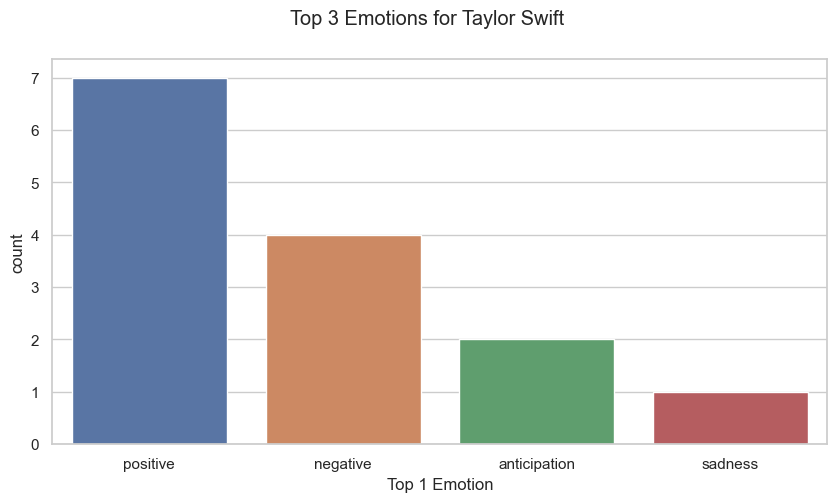

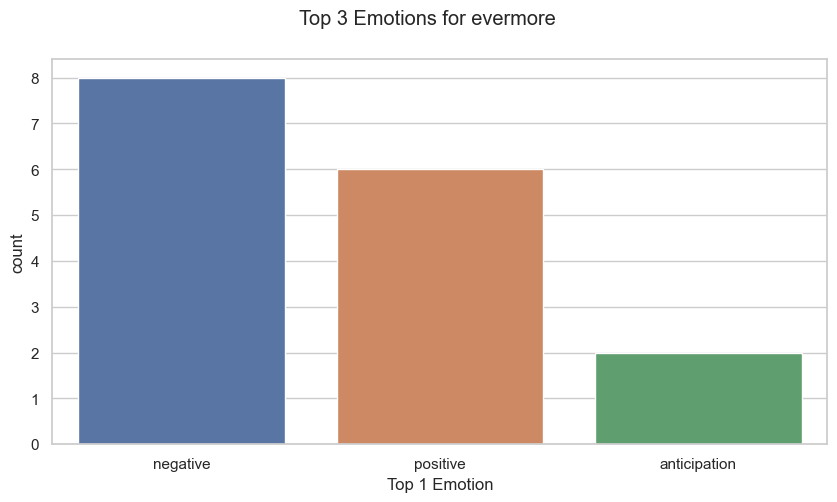

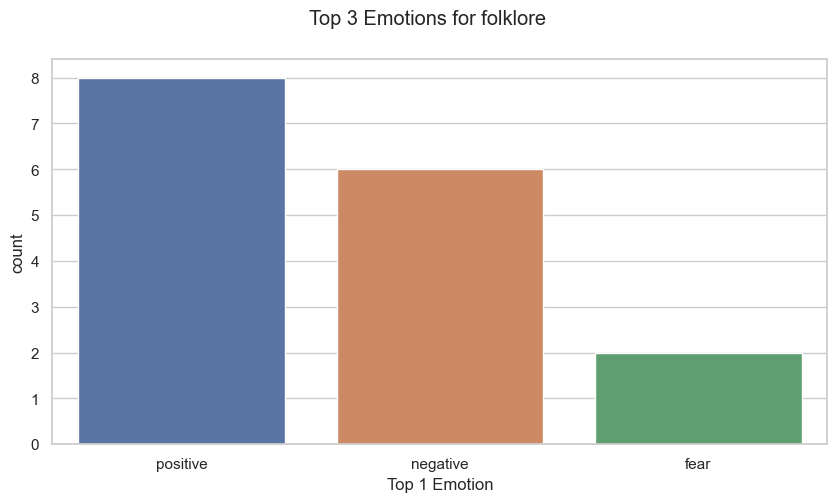

In [52]:
# Plot 
import warnings
warnings.filterwarnings('ignore')
#group by by album and plot emotion
df_grouped = df_copy.groupby('album')
# Plot the three top emotions for each album
for album, group in df_grouped:
    fig, ax = plt.subplots(figsize=(10, 5), ncols=1, nrows=1)

    sns.barplot(x=group['Top 1 Emotion'].value_counts().index, y=group['Top 1 Emotion'].value_counts(), hue=group['Top 1 Emotion'].value_counts().index, ax=ax)
    
    fig.suptitle(f'Top 3 Emotions for {album}')
    plt.show()
    fig.savefig(f'plots/emotions_{album}.png', dpi=300)

warnings.resetwarnings()

## Using NRCLex to detect emotions

In [28]:
def get_lyrics_scores_NRCLex(lyrics):
    words = (lyrics.lower())
    filtered_words = words #[word for word in words if word not in stopwords.words('english')]
    emotion = NRCLex(''.join(filtered_words))
    top_3_emotions = get_top_n_items(emotion.raw_emotion_scores, 3)
    
    return emotion.raw_emotion_scores, emotion.affect_frequencies, emotion.top_emotions, top_3_emotions
    

In [29]:
# Create hues based on all the available emotions
emotions = ['fear', 'anger', 'anticip', 'trust', 'surprise', 'positive', 'negative', 'sadness', 'disgust', 'joy', 'anticipation']
# Create a color palette
custom_palette = sns.color_palette("Set3", len(emotions))

In [30]:
df_copy = df_full.copy()
# For each song in the dataframe create 3 column each one for the top 3 emotions
df_copy['Top 1 Emotion'] = ''
df_copy['Top 2 Emotion'] = ''
df_copy['Top 3 Emotion'] = ''
df_copy['Top 1 Emotion Score'] = 0
df_copy['Top 2 Emotion Score'] = 0
df_copy['Top 3 Emotion Score'] = 0

for index, row in df_copy.iterrows():
    raw_emotion_scores, affect_frequencies, top_emotions, top_3_emotions = get_lyrics_scores_NRCLex(row['lyrics'])
    # Check len of top_3_emotions if less than 3 add empty values
    if len(top_3_emotions) < 3:
        for i in range(3 - len(top_3_emotions)):
            top_3_emotions.append(('Neutral', 0))
    df_copy.at[index, 'Top 1 Emotion'] = top_3_emotions[0][0]
    df_copy.at[index, 'Top 2 Emotion'] = top_3_emotions[1][0]
    df_copy.at[index, 'Top 3 Emotion'] = top_3_emotions[2][0]
    df_copy.at[index, 'Top 1 Emotion Score'] = top_3_emotions[0][1]
    df_copy.at[index, 'Top 2 Emotion Score'] = top_3_emotions[1][1]
    df_copy.at[index, 'Top 3 Emotion Score'] = top_3_emotions[2][1]

df_copy

,song_name,album,happy_sad,relationship,feelings_of_self,glass_half_full,stages,tempo,seriousness,future_prospects,...,togetherness,lyrics,spotify_uri,url,Top 1 Emotion,Top 2 Emotion,Top 3 Emotion,Top 1 Emotion Score,Top 2 Emotion Score,Top 3 Emotion Score
0,cold as you,Taylor Swift,-10,-8,-1,-3,-3,-3,-3,-3,...,-1,You have a way of coming easily to me\r\n And ...,7an1exwMnfYRcdVQm0yDev,https://open.spotify.com/track/7an1exwMnfYRcdV...,negative,positive,sadness,13,10,7
1,i'm only me when i'm with you,Taylor Swift,9,10,3,3,1,2,2,2,...,3,Friday night beneath the stars\r\n In a field ...,0JIdBrXGSJXS72zjF9ss9u,https://open.spotify.com/track/0JIdBrXGSJXS72z...,sadness,fear,negative,10,10,10
2,invisible,Taylor Swift,-1,-4,0,-2,1,0,0,0,...,-3,She can't see the way your eyes\r\n Light up w...,5OOd01o2YS1QFwdpVLds3r,https://open.spotify.com/track/5OOd01o2YS1QFwd...,positive,joy,trust,13,12,8
3,mary's song,Taylor Swift,5,12,0,2,1,2,3,3,...,3,She said I was seven and you were nine\r\n I l...,2QrQCMel6v2JiLxqrg4p2O,https://open.spotify.com/track/2QrQCMel6v2JiLx...,positive,anticipation,joy,11,7,7
4,our song,Taylor Swift,5,6,2,2,1,0,1,1,...,1,I was ridin' shotgun with my hair undone\r\n I...,15DeqWWQB4dcEWzJg15VrN,https://open.spotify.com/track/15DeqWWQB4dcEWz...,positive,joy,trust,20,13,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,paris,Midnights,6,6,1,2,1,2,1,2,...,2,"""Your ex-friend's sister\r\n Met someone at a ...",5tWxKWq1DSP1s9WQ5PWuqu,https://open.spotify.com/track/5tWxKWq1DSP1s9W...,positive,negative,joy,14,11,8
176,high infidelity,Midnights,-1,-9,-2,-1,2,0,-2,-2,...,-3,"Lock broken, slur spoken\r\n Wound open, game ...",5kiZGSxgqPdv6rbqL9THdd,https://open.spotify.com/track/5kiZGSxgqPdv6rb...,negative,sadness,fear,29,22,21
177,glitch,Midnights,1,7,1,1,-1,0,2,2,...,1,We were supposed to be just friends\r\n You do...,7C0w28EsX0Um2FrZs9gso2,https://open.spotify.com/track/7C0w28EsX0Um2Fr...,joy,positive,trust,9,9,7
178,"would've, could've, should've",Midnights,-3,-4,-2,-1,-2,2,-2,-1,...,-1,"If you would've blinked, then I would've\r\n L...",4txojlesMFQZGWxwz2EeqB,https://open.spotify.com/track/4txojlesMFQZGWx...,negative,fear,sadness,29,27,25


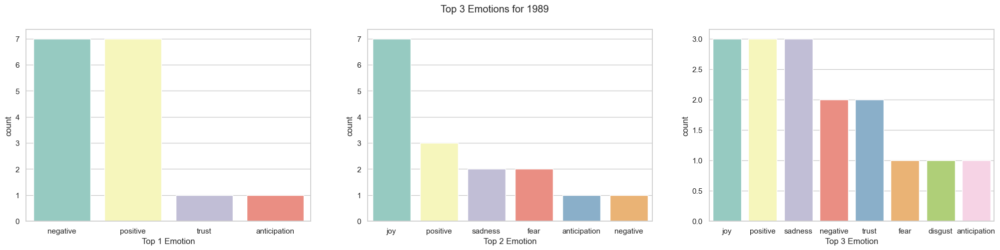

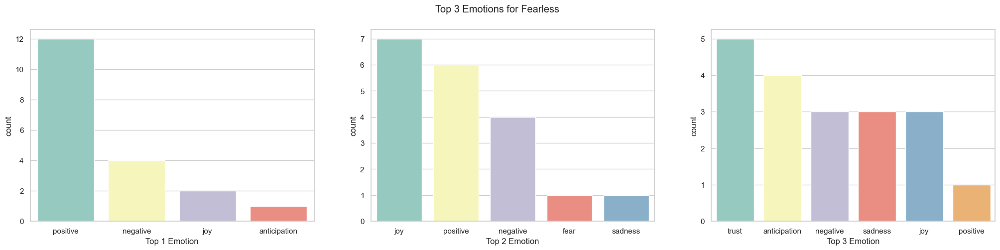

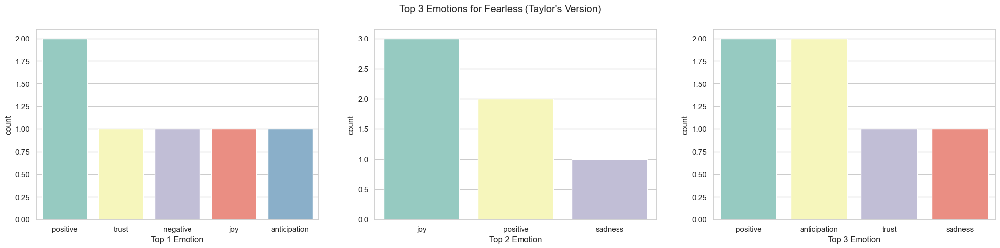

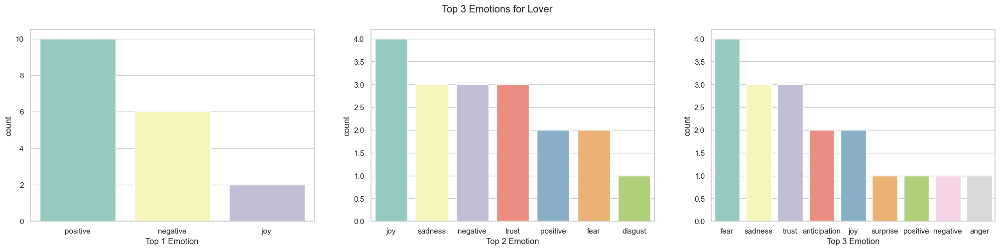

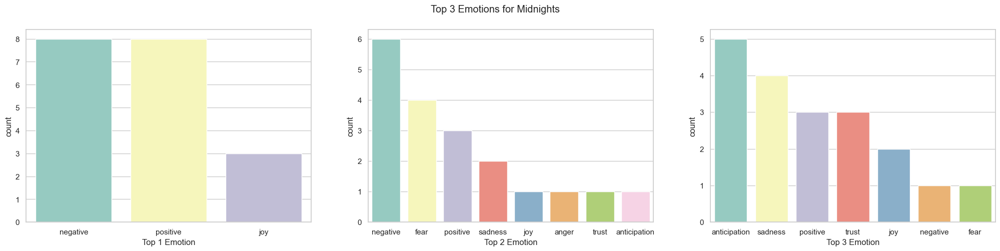

...

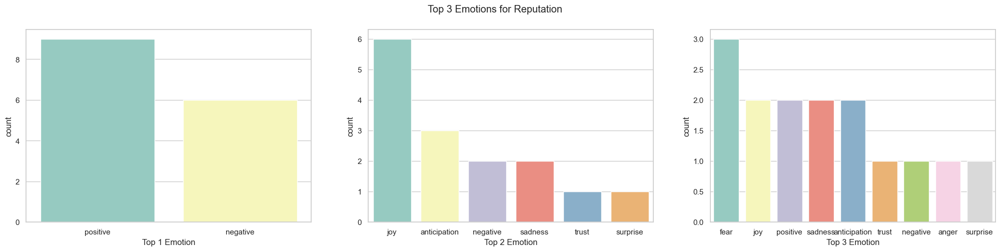

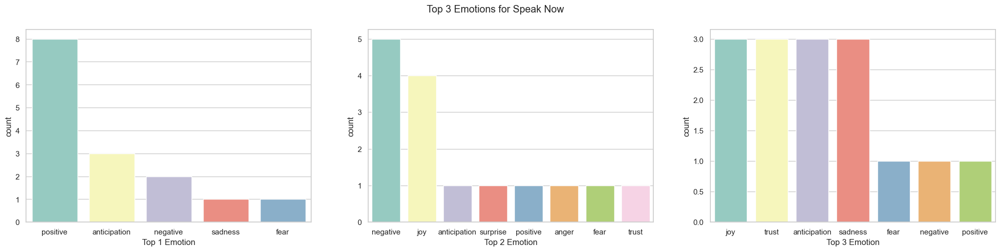

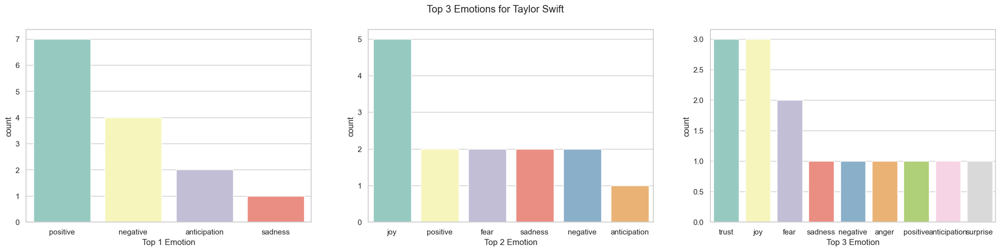

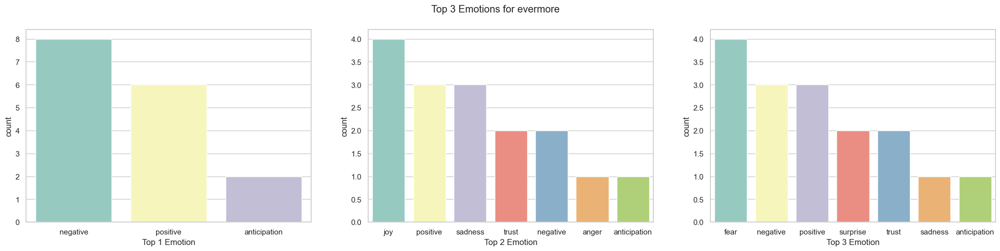

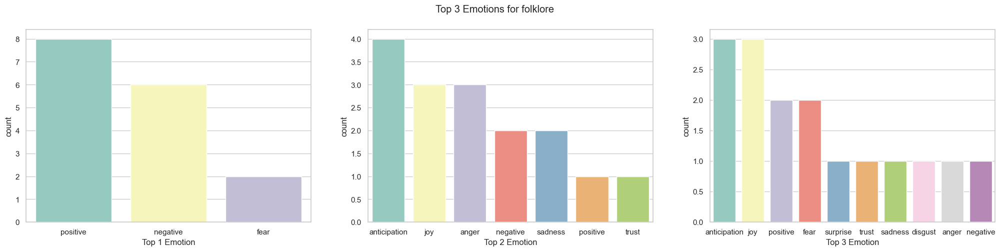

In [53]:
import warnings
warnings.filterwarnings('ignore')
#group by by album and plot emotion
df_grouped = df_copy.groupby('album')
# Plot the three top emotions for each album
for album, group in df_grouped:
    fig, ax = plt.subplots(figsize=(25, 5), ncols=3, nrows=1)

    sns.barplot(x=group['Top 1 Emotion'].value_counts().index, y=group['Top 1 Emotion'].value_counts(), hue=group['Top 1 Emotion'].value_counts().index, ax=ax[0], palette=custom_palette, legend=False)
    sns.barplot(x=group['Top 2 Emotion'].value_counts().index, y=group['Top 2 Emotion'].value_counts(), hue=group['Top 2 Emotion'].value_counts().index, ax=ax[1], palette=custom_palette, legend=False)
    sns.barplot(x=group['Top 3 Emotion'].value_counts().index, y=group['Top 3 Emotion'].value_counts(), hue=group['Top 3 Emotion'].value_counts().index, ax=ax[2], palette=custom_palette, legend=False)
    
    fig.suptitle(f'Top 3 Emotions for {album}')
    fig.savefig(f'plots/emotions_NRC_{album}.png', dpi=300)
    plt.show()

warnings.resetwarnings()

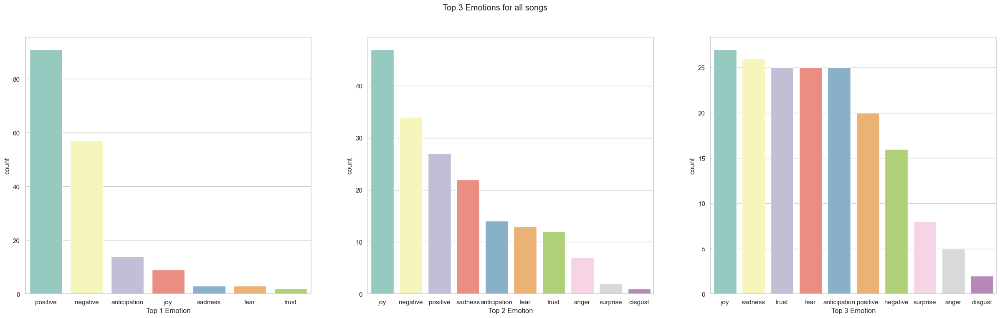

In [58]:
import warnings
warnings.filterwarnings('ignore')
#group by by album and plot emotion
df_plot = df_copy.copy()
# Plot the three top emotions for each album

fig, ax = plt.subplots(figsize=(30, 8), ncols=3, nrows=1)


sns.barplot(x=df_plot['Top 1 Emotion'].value_counts().index, y=df_plot['Top 1 Emotion'].value_counts(), hue=df_plot['Top 1 Emotion'].value_counts().index, ax=ax[0], palette=custom_palette, legend=False)
sns.barplot(x=df_plot['Top 2 Emotion'].value_counts().index, y=df_plot['Top 2 Emotion'].value_counts(), hue=df_plot['Top 2 Emotion'].value_counts().index, ax=ax[1], palette=custom_palette, legend=False)
sns.barplot(x=df_plot['Top 3 Emotion'].value_counts().index, y=df_plot['Top 3 Emotion'].value_counts(), hue=df_plot['Top 3 Emotion'].value_counts().index, ax=ax[2], palette=custom_palette, legend=False)

fig.suptitle(f'Top 3 Emotions for all songs')
fig.savefig(f'plots/emotions_NRC_all_songs.png', dpi=300)
plt.show()

warnings.resetwarnings()

In [32]:
! pip install Pillow
! pip install wordcloud

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)



[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)



[notice] A new release of pip is available: 23.2.1 -> 24.0
[notice] To update, run: pip install --upgrade pip


In [33]:
def prepare_words(lyrics):
    words = word_tokenize(lyrics.lower())
    filtered_words = [word for word in words if word not in words_extended and len(word)>1]
    return ' '.join(filtered_words)

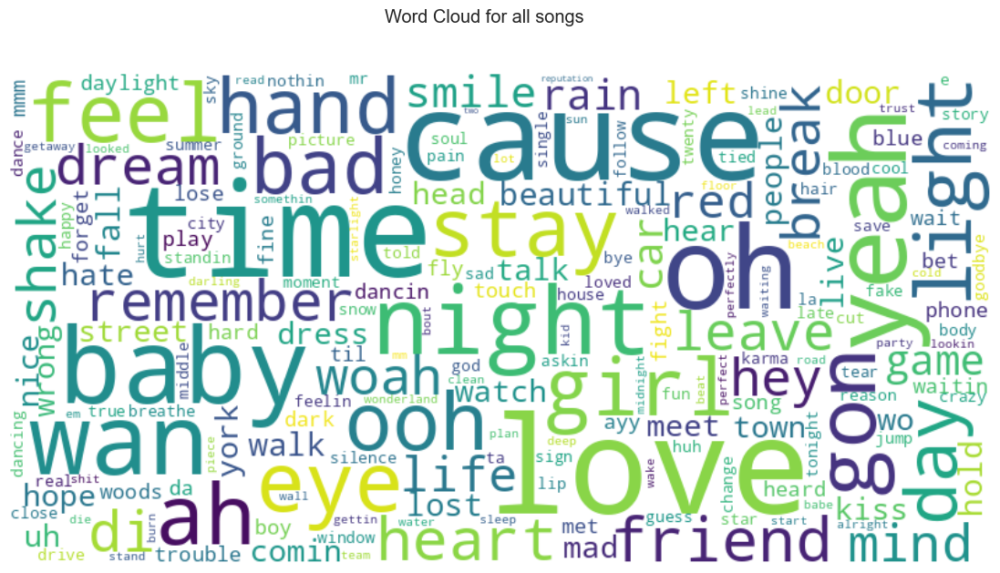

In [34]:
all_lyrics = prepare_words(' '.join(df_full['lyrics']))
word_cloud = WordCloud(width=800, height=400, max_font_size=110, background_color='white', collocations=False).generate(all_lyrics)
plt.figure(figsize=(14, 7))
plt.suptitle('Word Cloud for all songs')
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.show()

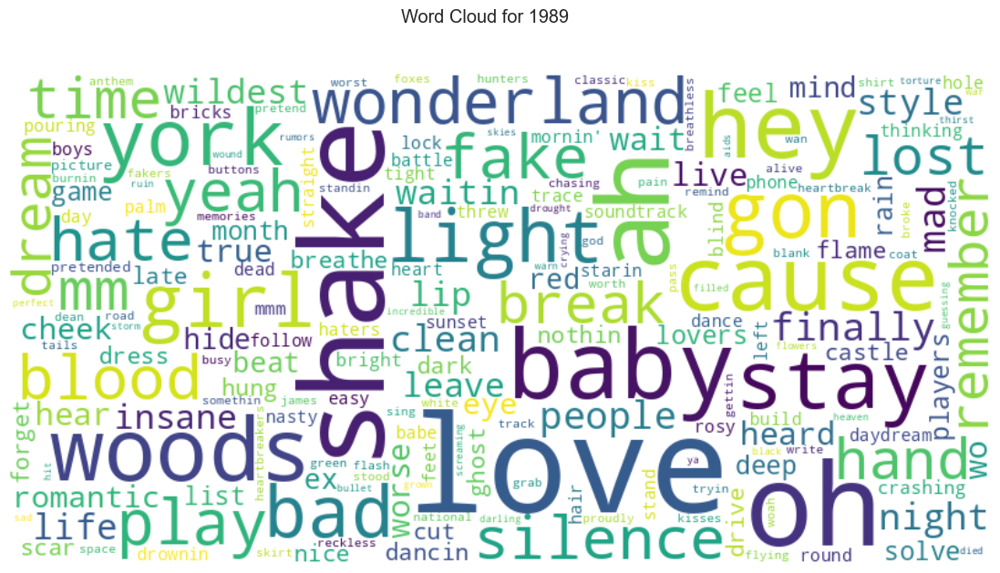

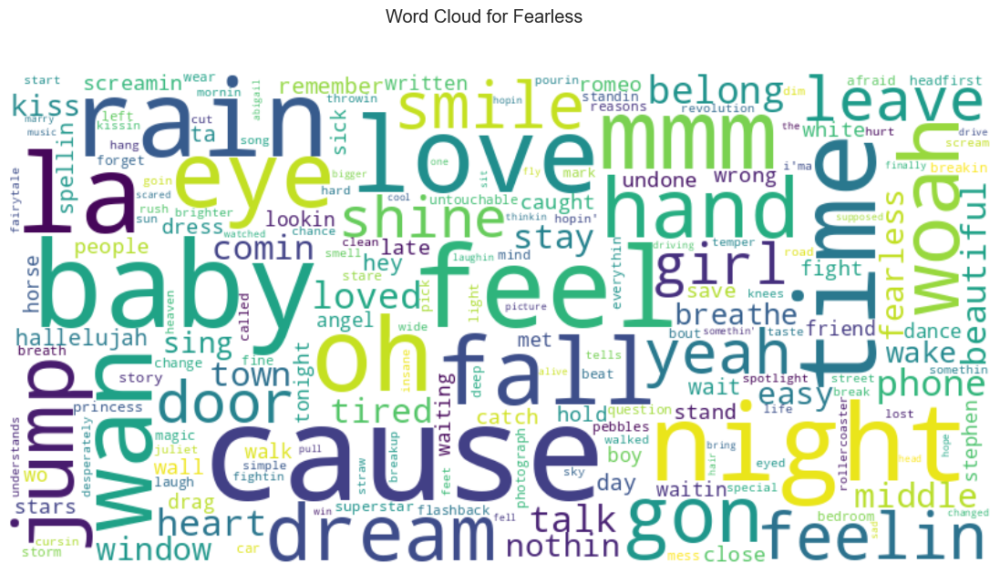

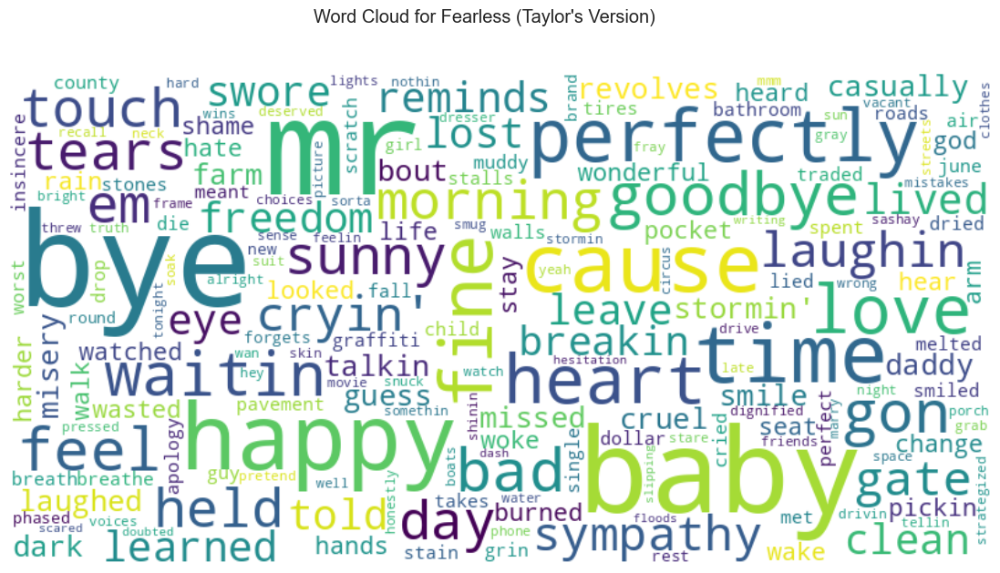

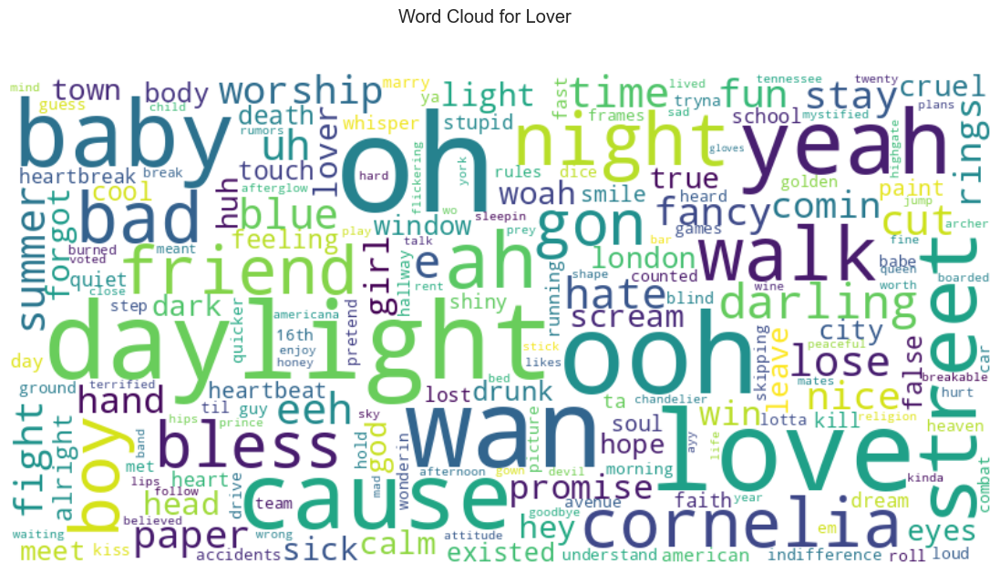

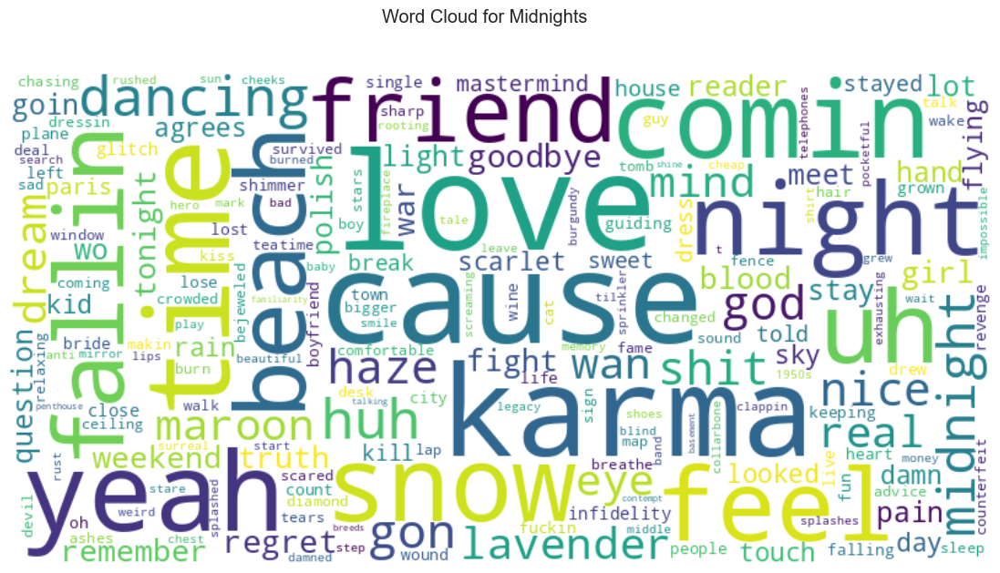

...

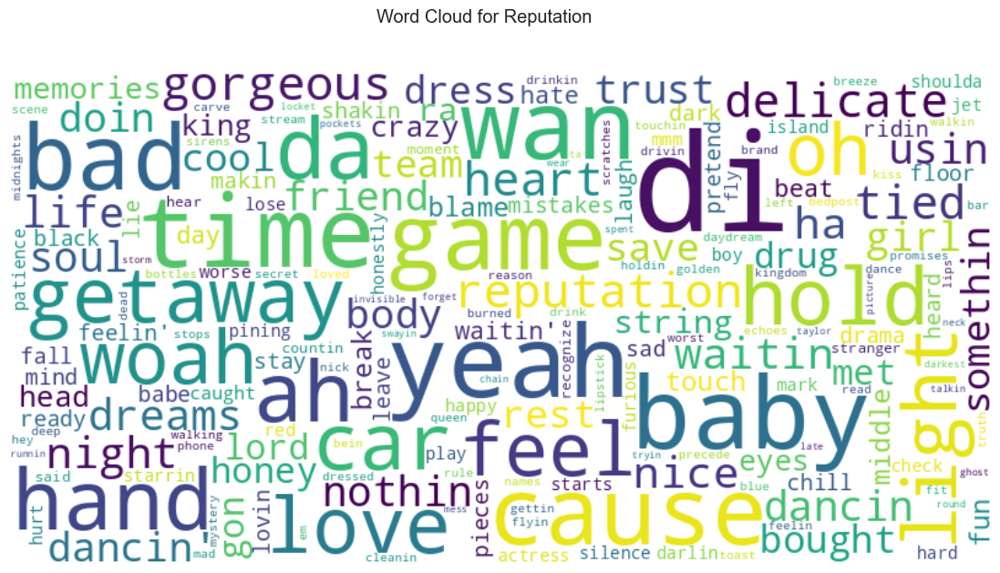

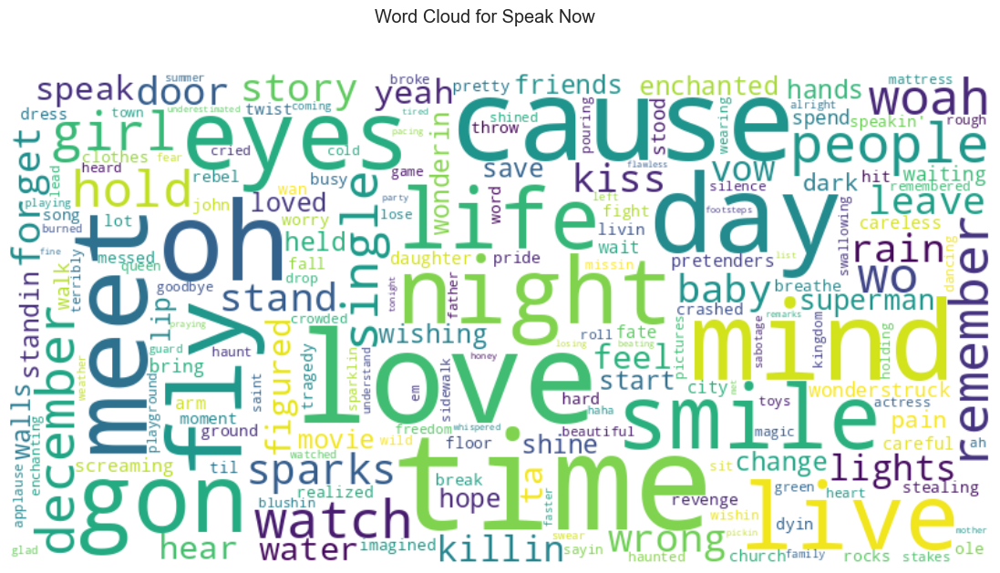

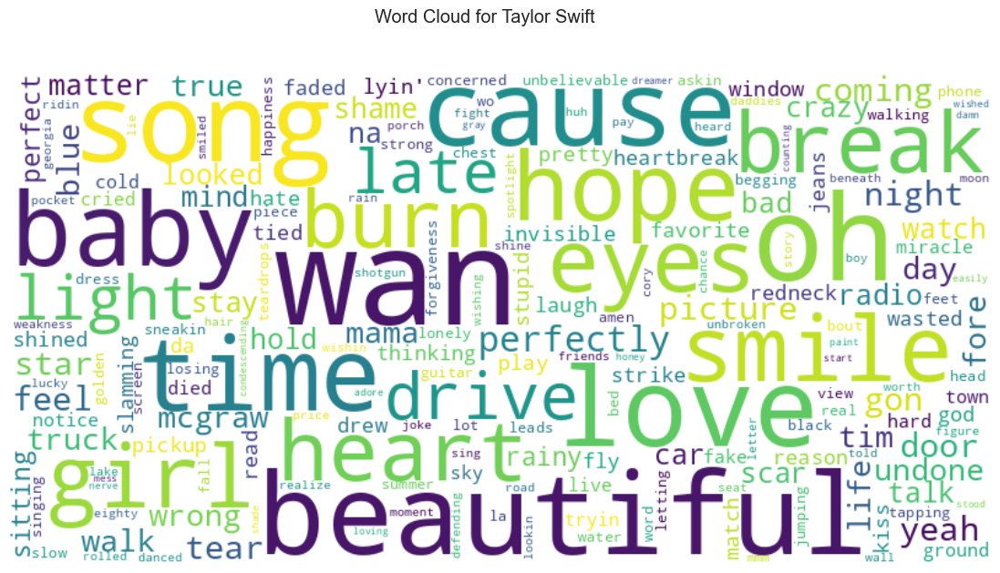

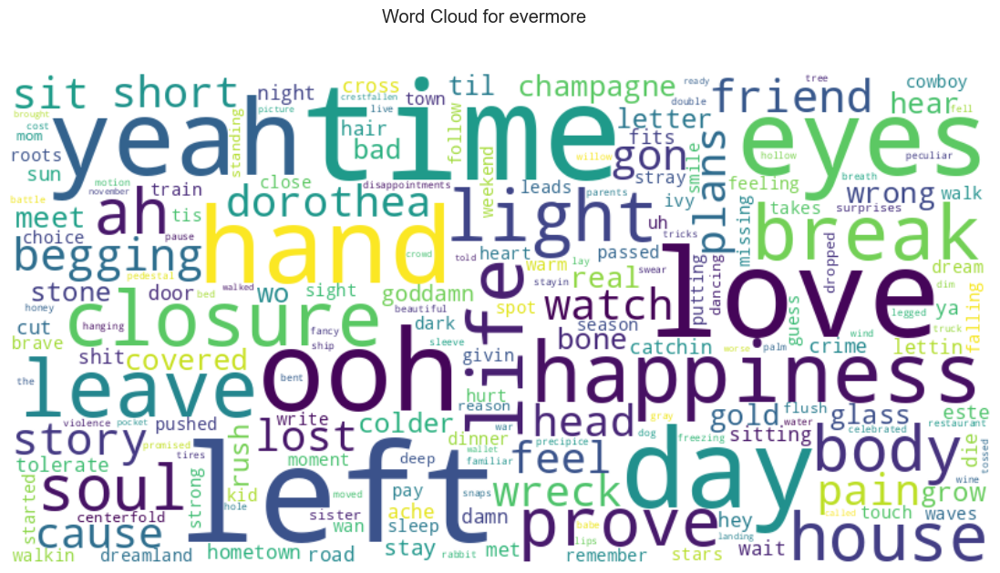

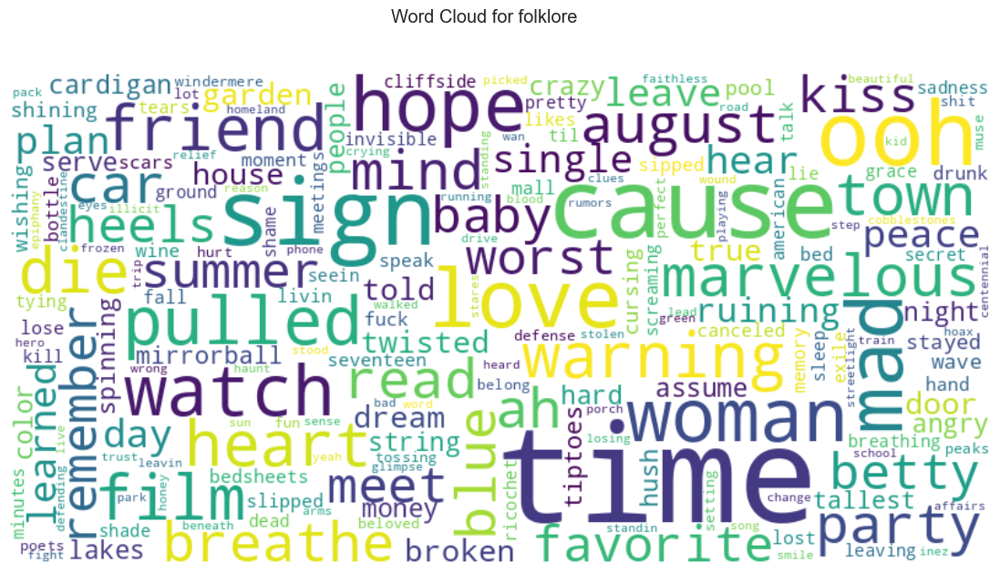

In [35]:
# Wordcloud for each album
for album, group in df_grouped:
    all_lyrics = prepare_words(' '.join(group['lyrics']))
    word_cloud = WordCloud(width=800, height=400, max_font_size=110, background_color='white', collocations=False).generate(all_lyrics)
    plt.figure(figsize=(14, 7))
    plt.suptitle(f'Word Cloud for {album}')
    plt.imshow(word_cloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

In [48]:
def remove_extra_stopwords(words):
    not_allowed = ['oh-oh', "'cause", "hey", "wan", "yeah", "woah"]
    return [word for word in words if word not in not_allowed]

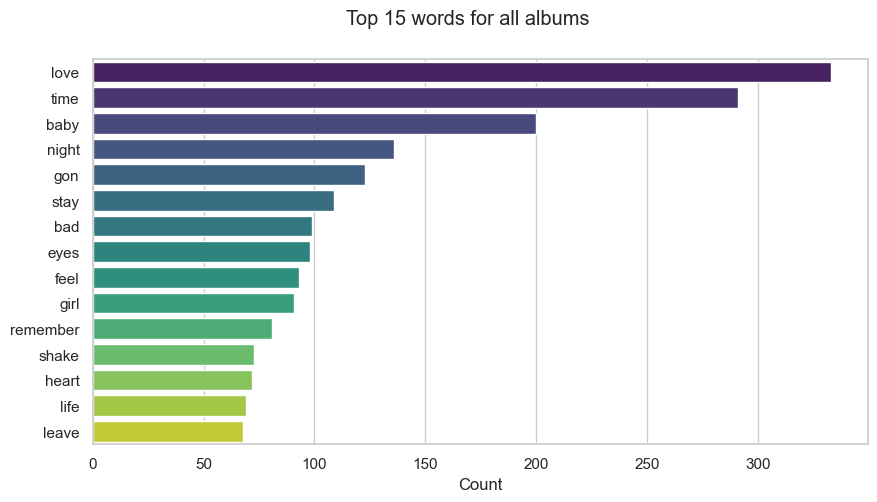

In [60]:
# plot most common words considering all albums
warnings.filterwarnings('ignore')
words = (prepare_words(' '.join(df_full['lyrics']))).split()
words = remove_extra_stopwords(words)
word_freq = nltk.FreqDist(words)
word_freq = {k: v for k, v in sorted(word_freq.items(), key=lambda item: item[1], reverse=True)}
fig, ax = plt.subplots(figsize=(10, 5), ncols=1, nrows=1)
sns.barplot(y=list(word_freq.keys())[:15], x=list(word_freq.values())[:15], ax=ax, orient='h', palette='viridis')
ax.set_xlabel('Count')
fig.suptitle('Top 15 words for all albums')
fig.savefig(f'plots/words_all_albums.png', dpi=300)
plt.show()
warnings.resetwarnings()

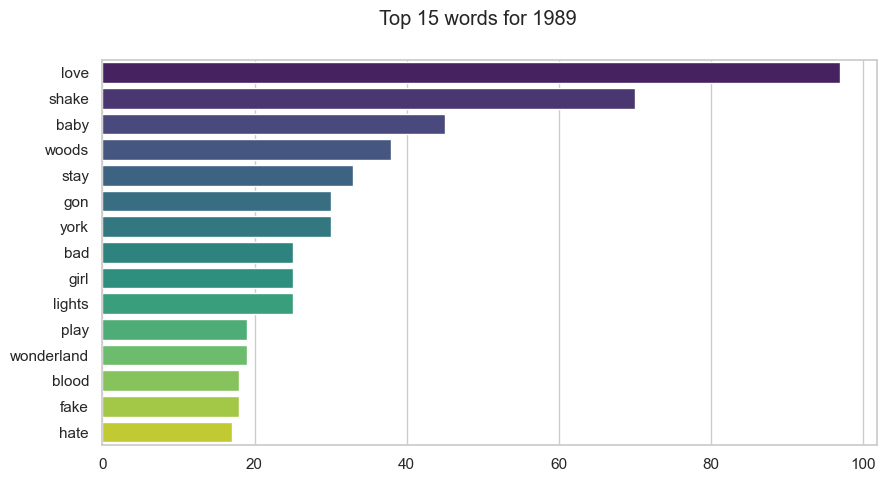

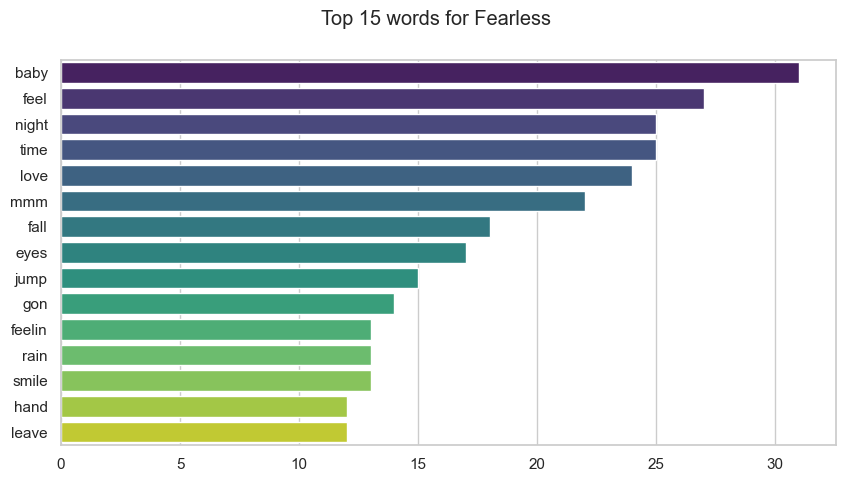

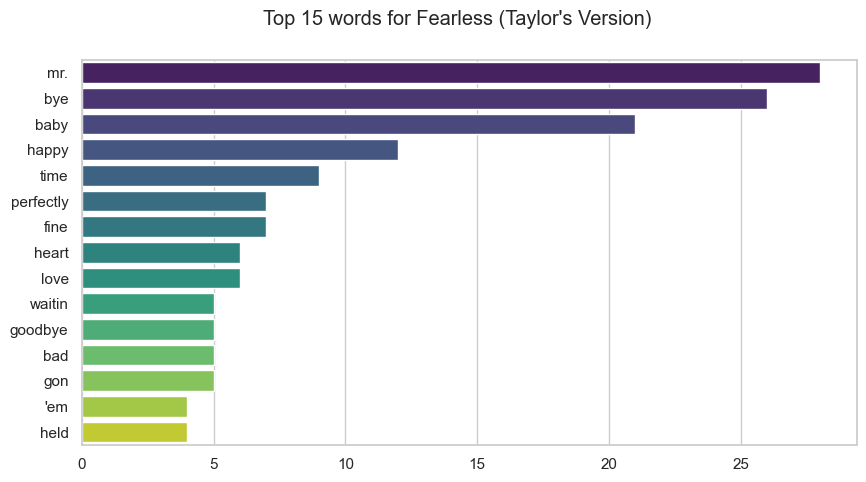

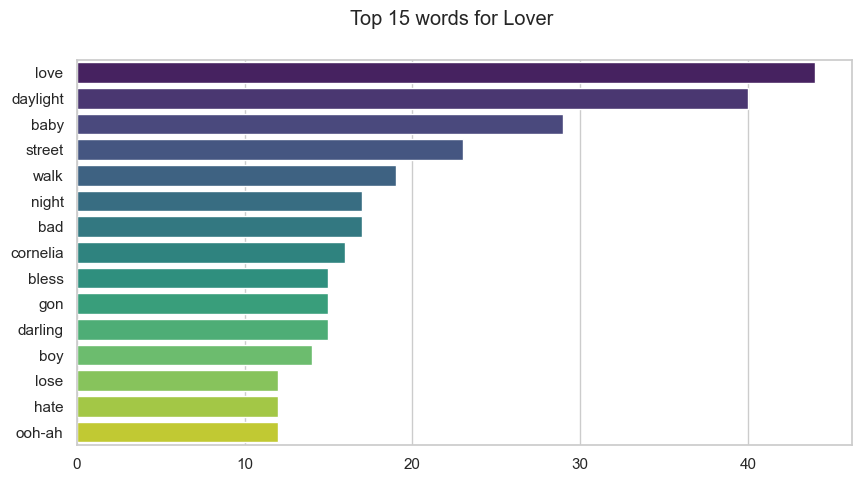

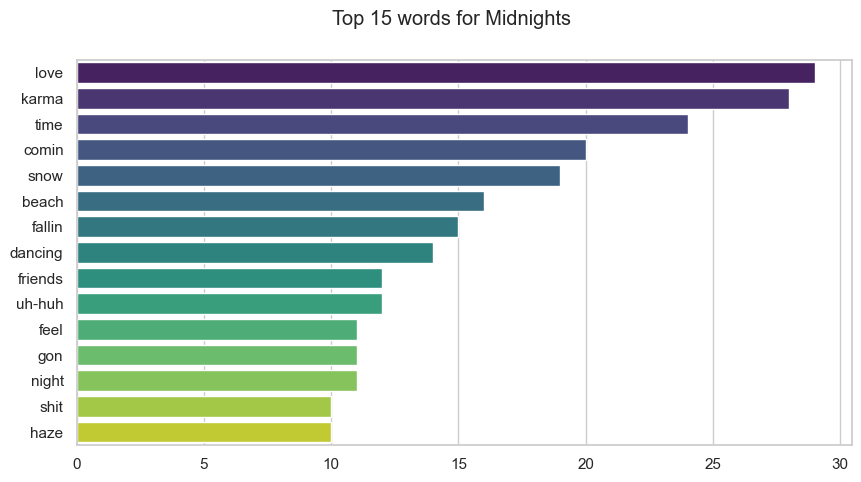

...

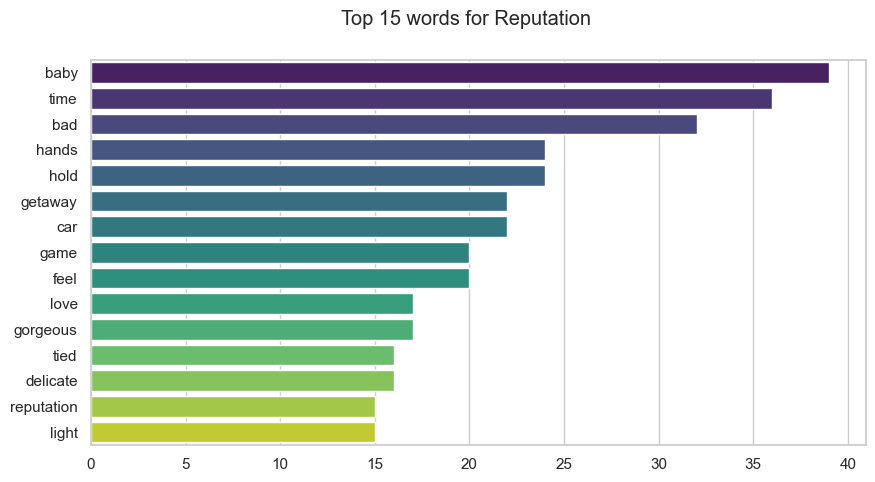

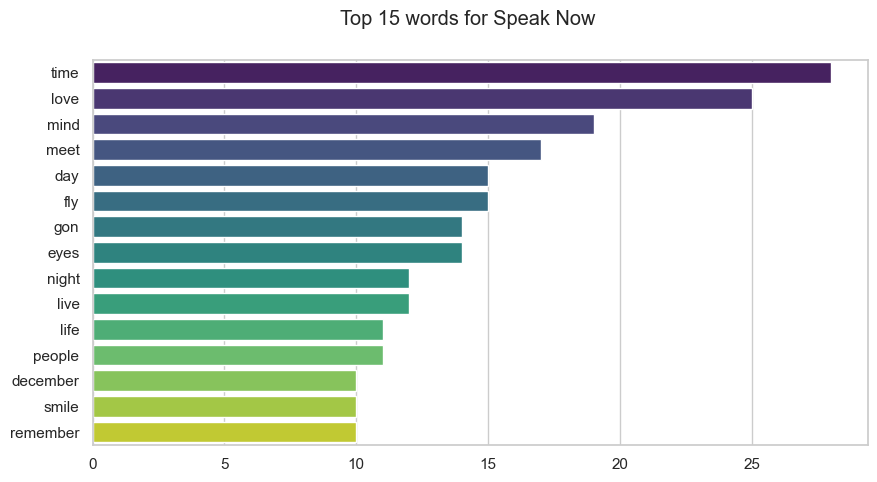

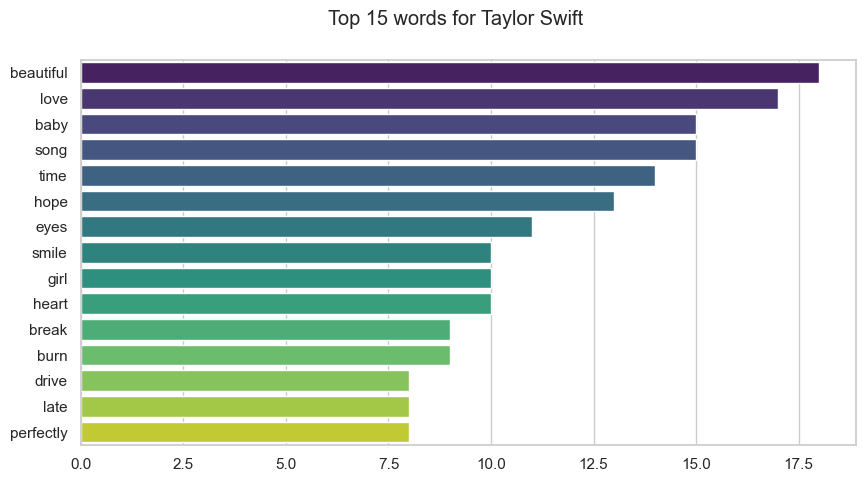

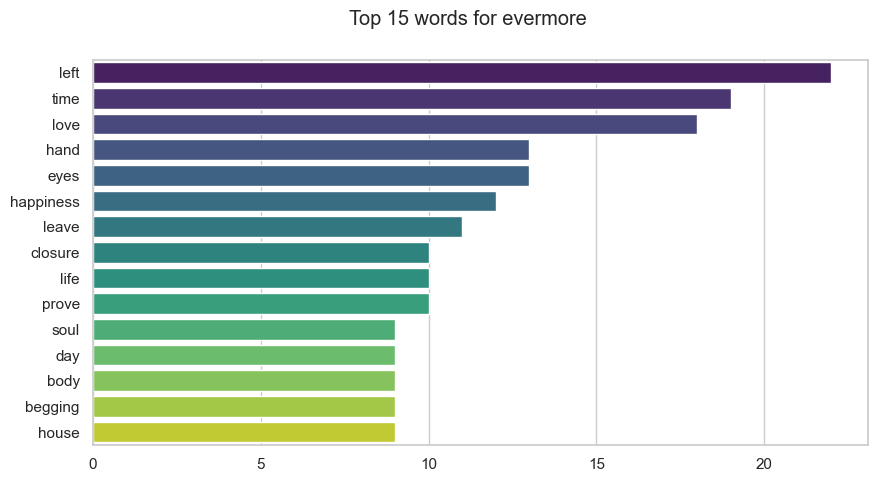

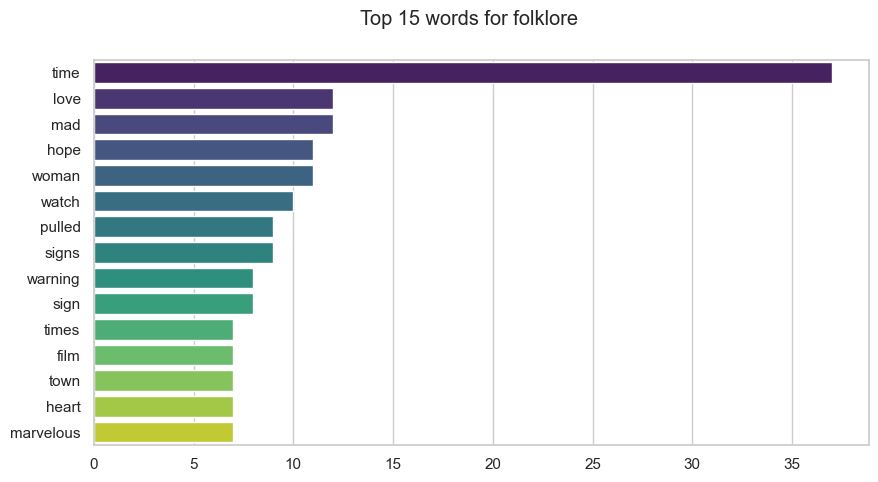

In [50]:
# remove stopwords and plot the most relevant and 15 recurrent words for each album
warnings.filterwarnings('ignore')
for album, group in df_grouped:
    fig, ax = plt.subplots(figsize=(10, 5), ncols=1, nrows=1)
    words = (prepare_words(' '.join(group['lyrics']))).split()
    words = remove_extra_stopwords(words)
    word_freq = nltk.FreqDist(words)
    word_freq = {k: v for k, v in sorted(word_freq.items(), key=lambda item: item[1], reverse=True)}
    sns.barplot(y=list(word_freq.keys())[:15], x=list(word_freq.values())[:15], ax=ax, orient='h', palette='viridis')
    fig.suptitle(f'Top 15 words for {album}')
    plt.show()
warnings.resetwarnings()

In [38]:
#########